<a href="https://colab.research.google.com/github/joerobo2/Oeson-Learning-Data-Science-Internship/blob/Project-1/Uncorked_Insights_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Executive Summary**

## **Project: Linear Regression Analysis of Red and White Wine Quality**

### Objective:
  * To develop predictive models to estimate the quality of red and white wines based on their chemical composition, aligning with the business task of understanding factors influencing wine quality and informing strategic decisions.

### Key Findings:

  * Consistent Predictors: Several chemical properties consistently influenced both red and white wine quality, including volatile activity, chlorides, density, pH, sulphates, and alcohol.
  
  * Quality Differences: While there are common factors influencing quality, the relative importance of these factors varies between red and white wines.
  
  * Optimal Ranges: Specific ranges for these factors were identified for high-quality wines of both types.

### Business Implications:

  * Wine Production: Optimize winemaking processes by targeting specific chemical attributes to achieve desired quality levels.
  
  * Sales and Marketing: Develop targeted marketing campaigns based on consumer preferences for specific wine characteristics.
  
  * Wine Procurement: Establish quality standards and guidelines for purchasing wines based on the identified key factors.
  
  * Pricing: Implement pricing strategies that reflect the perceived quality of wines, considering the factors identified in the models.

### Recommendations:

  * Further Research: Expand the study to include wines from different regions and consider additional factors such as sensory attributes and vineyard characteristics.
  
  * Model Refinement: Explore alternative modeling techniques and address the limitations identified in the current analysis.
  
  * Data Expansion: Collect more comprehensive data to improve the generalizability and robustness of the models.

### Conclusion

  * The study provides valuable insights into the factors influencing red and white wine quality. By understanding these factors, our stakeholders can make informed decisions to improve wine production, marketing, procurement, and pricing strategies. Future research can further refine and expand upon these findings to enhance the understanding of wine quality and support the wine industry.

In [1]:
# Import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
# Load dataset

df = pd.read_csv('/kaggle/input/combined-wine-data/wine_combined.csv')

In [3]:
# Check data set

df.head()

,fixedacidity,volatileacidity,citricacid,residualsugar,chlorides,freesulfurdioxide,totalsulfurdioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [4]:
# Wine Dataset information

df.info()
print('\n Rows and Cols')
print(df.shape)
print('\n Wine Summary Statistics')
print(df.describe(include='all').transpose())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fixedacidity        6497 non-null   float64
 1   volatileacidity     6497 non-null   float64
 2   citricacid          6497 non-null   float64
 3   residualsugar       6497 non-null   float64
 4   chlorides           6497 non-null   float64
 5   freesulfurdioxide   6497 non-null   float64
 6   totalsulfurdioxide  6497 non-null   float64
 7   density             6497 non-null   float64
 8   pH                  6497 non-null   float64
 9   sulphates           6497 non-null   float64
 10  alcohol             6497 non-null   float64
 11  quality             6497 non-null   int64  
 12  type                6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB

 Rows and Cols
(6497, 13)

 Wine Summary Statistics
                     count unique    top

In [5]:
# Confirm no missing values

df.isna().sum()

fixedacidity          0
volatileacidity       0
citricacid            0
residualsugar         0
chlorides             0
freesulfurdioxide     0
totalsulfurdioxide    0
density               0
pH                    0
sulphates             0
alcohol               0
quality               0
type                  0
dtype: int64

In [6]:
# Trim spaces by using the rename method for col names

df = df.rename(columns=({' fixed acidity ': 'fixed_acidity', ' volatile acidity ': 'volatile_activity',
                                 ' citric acid ': 'citric_acid', ' residual sugar ': 'residual_sugar',
                                 ' chlorides ': 'chlorides', ' free sulfur dioxide ': 'free_sulfur_dioxide',
                                 ' total sulfur dioxide ': 'total_sulfur_dioxide', ' density ': 'density',
                                 ' pH ': 'pH', ' sulphates ': 'sulphates', ' alcohol ': 'alcohol',
                                 ' quality ': 'quality'}))



In [7]:
# Confirm spaces are trimmed

df.columns

Index(['fixedacidity', 'volatileacidity', 'citricacid', 'residualsugar',
       'chlorides', 'freesulfurdioxide', 'totalsulfurdioxide', 'density', 'pH',
       'sulphates', 'alcohol', 'quality', 'type'],
      dtype='object')

In [8]:
# Change to snake case

df = df.rename(columns=({'fixedacidity': 'fixed_acidity', 'volatileacidity': 'volatile_activity',
                                 'citricacid': 'citric_acid', 'residualsugar': 'residual_sugar',
                                 'chlorides': 'chlorides', 'freesulfurdioxide': 'free_sulfur_dioxide',
                                 'totalsulfurdioxide': 'total_sulfur_dioxide', 'density': 'density',
                                 'pH': 'pH', 'sulphates': 'sulphates', 'alcohol': 'alcohol',
                                 'quality': 'quality'}))


In [9]:
# Confirm snake case

df.columns

Index(['fixed_acidity', 'volatile_activity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'type'],
      dtype='object')

In [10]:
# Check datatpyes

print('Data Types: ')
print(df.dtypes)

Data Types: 
fixed_acidity           float64
volatile_activity       float64
citric_acid             float64
residual_sugar          float64
chlorides               float64
free_sulfur_dioxide     float64
total_sulfur_dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
type                     object
dtype: object


In [11]:
# Measure of Central Tendancy
# Dropping categorical variable to run the following measures

df2 = df.drop('type', axis=1)

print('Mean: ')
print(df2.mean())
print('\nMedian: ')
print(df2.median())
print('\nMode: ')
print(df2.mode())
print()


Mean: 
fixed_acidity             7.215307
volatile_activity         0.339666
citric_acid               0.318633
residual_sugar            5.443235
chlorides                 0.056034
free_sulfur_dioxide      30.525319
total_sulfur_dioxide    115.744574
density                   0.994697
pH                        3.218501
sulphates                 0.531268
alcohol                  10.491801
quality                   5.818378
dtype: float64

Median: 
fixed_acidity             7.00000
volatile_activity         0.29000
citric_acid               0.31000
residual_sugar            3.00000
chlorides                 0.04700
free_sulfur_dioxide      29.00000
total_sulfur_dioxide    118.00000
density                   0.99489
pH                        3.21000
sulphates                 0.51000
alcohol                  10.30000
quality                   6.00000
dtype: float64

Mode: 
   fixed_acidity  volatile_activity  citric_acid  residual_sugar  chlorides  \
0            6.8               0.28   

In [12]:
# Measures of Dispersion

print('Variance: ')
print(df2.var())

print('\nStandard Deviation: ')
print(np.std(df2))


Variance: 
fixed_acidity              1.680740
volatile_activity          0.027105
citric_acid                0.021117
residual_sugar            22.636696
chlorides                  0.001227
free_sulfur_dioxide      315.041192
total_sulfur_dioxide    3194.720039
density                    0.000009
pH                         0.025853
sulphates                  0.022143
alcohol                    1.422561
quality                    0.762575
dtype: float64

Standard Deviation: 
fixed_acidity            1.296334
volatile_activity        0.164624
citric_acid              0.145307
residual_sugar           4.757438
chlorides                0.035031
free_sulfur_dioxide     17.748034
total_sulfur_dioxide    56.517505
density                  0.002998
pH                       0.160775
sulphates                0.148794
alcohol                  1.192620
quality                  0.873188
dtype: float64


/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3643: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


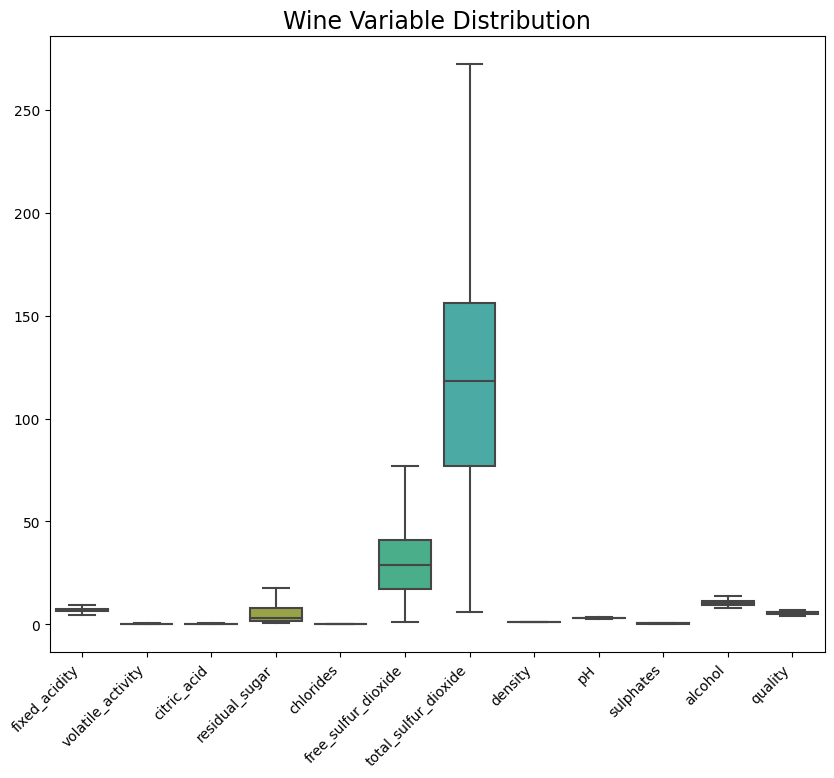

In [13]:
# Check variable distribution

plt.figure(figsize=(10,8))
sns.boxplot(df, showfliers=False,)
plt.title('Wine Variable Distribution', fontsize=17)
plt.xticks(horizontalalignment='right', rotation=45)
plt.show()

In [14]:
# Check outliers
 # Multiplied median values of the following variables by 1.5 and removed outliers

z = df[df['total_sulfur_dioxide']<=177]
z = z[z['free_sulfur_dioxide']<=43.5]
z = z[z['residual_sugar']<=4.5]
z = z[z['fixed_acidity']<10.8]
print(z.describe().transpose())
print()
print(z.info())

                       count       mean        std      min      25%  \
fixed_acidity         3142.0   7.287301   1.199533  3.90000   6.4000   
volatile_activity     3142.0   0.386692   0.193703  0.08000   0.2400   
citric_acid           3142.0   0.288444   0.151457  0.00000   0.2100   
residual_sugar        3142.0   2.062651   0.794029  0.60000   1.5000   
chlorides             3142.0   0.061704   0.042061  0.01200   0.0370   
free_sulfur_dioxide   3142.0  21.031827  10.735464  1.00000  12.0000   
total_sulfur_dioxide  3142.0  83.197008  43.920397  6.00000  43.2500   
density               3142.0   0.993724   0.002834  0.98711   0.9914   
pH                    3142.0   3.260181   0.164995  2.74000   3.1500   
sulphates             3142.0   0.560656   0.162947  0.25000   0.4500   
alcohol               3142.0  10.798854   1.170565  8.40000   9.8000   
quality               3142.0   5.813495   0.889413  3.00000   5.0000   

                            50%       75%      max  
fixed_acid

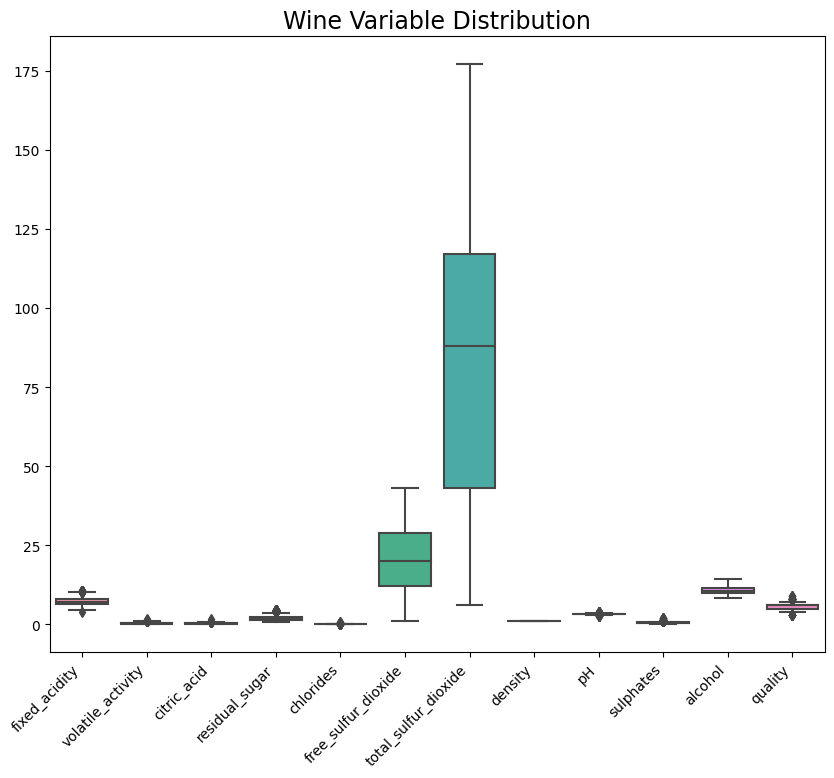

In [15]:
# Recheck distribution without outliers

plt.figure(figsize=(10,8))
sns.boxplot(z, showfliers=True,)
plt.title('Wine Variable Distribution', fontsize=17)
plt.xticks(horizontalalignment='right', rotation=45)
plt.show()

In [16]:
# Check wine type distribution after outlier removal

z['type'].value_counts()

type
white    1801
red      1341
Name: count, dtype: int64

In [17]:
# Check Summary Stastistics for each variable
# When reading this chart, under the variable name is the actual value;
# the associated mean and quartiles are related to quality

print('\nFixed Acidity vs Quality Summary Statistics\n')
print(z.groupby('fixed_acidity')['quality'].describe().transpose())
print('\nVolatile Activity vs Quality Summary Statistics\n')
print(z.groupby('volatile_activity')['quality'].describe().transpose())
print('\nCitric Acid vs Quality Summary Statistics\n')
print(z.groupby('citric_acid')['quality'].describe().transpose())
print('\nResidual Sugar vs Quality Summary Statistics\n')
print(z.groupby('residual_sugar')['quality'].describe().transpose())
print('\nChlorides vs Quality Summary Statistics\n')
print(z.groupby('chlorides')['quality'].describe().transpose())
print('\nFree Sulfur Dioxide vs Quality Summary Statistics \n')
print(z.groupby('free_sulfur_dioxide')['quality'].describe().transpose())
print('\nTotal Sulfur Dioxide vs Quality Summary Statistics \n')
print(z.groupby('total_sulfur_dioxide')['quality'].describe().transpose())
print('\nDensity vs Quality Summary Statistics \n')
print(z.groupby('density')['quality'].describe().transpose())
print('\npH vs Quality Summary Statistics \n')
print(z.groupby('pH')['quality'].describe().transpose())
print('\nSulphates vs Quality Summary Statistics \n')
print(z.groupby('sulphates')['quality'].describe().transpose())
print('\nAlcohol vs Quality Summary Statistics \n')
print(z.groupby('alcohol')['quality'].describe().transpose())



Fixed Acidity vs Quality Summary Statistics

fixed_acidity  3.9       4.4   4.6       4.7       4.8   4.9        5.0   \
count           1.0  2.000000   1.0  5.000000  3.000000  4.00  14.000000   
mean            8.0  7.000000   4.0  6.000000  6.000000  6.25   6.071429   
std             NaN  1.414214   NaN  0.707107  1.732051  1.50   0.916875   
min             8.0  6.000000   4.0  5.000000  4.000000  5.00   4.000000   
25%             8.0  6.500000   4.0  6.000000  5.500000  5.00   6.000000   
50%             8.0  7.000000   4.0  6.000000  7.000000  6.00   6.000000   
75%             8.0  7.500000   4.0  6.000000  7.000000  7.25   6.000000   
max             8.0  8.000000   4.0  7.000000  7.000000  8.00   8.000000   

fixed_acidity       5.1        5.2        5.3   ...       9.8        9.9   \
count          17.000000  25.000000  18.000000  ...  18.000000  22.000000   
mean            6.294118   6.560000   6.000000  ...   5.777778   5.318182   
std             0.771744   1.157584   

In [18]:
# Checking each variable's value count in relation to quality
# These tables are read variable name > value, quality > value, count for each given pair

print('\nFixed Acidity vs Quality Value Count\n')
print(z.groupby('fixed_acidity')['quality'].value_counts(normalize=True).sort_values(ascending=True))
print('\nVolatile Activity vs Quality Value Count\n')
print(z.groupby('volatile_activity')['quality'].value_counts(normalize=True).sort_values(ascending=False))
print('\nCitric Acid vs Quality Value Count\n')
print(z.groupby('citric_acid')['quality'].value_counts(normalize=True).sort_values(ascending=False))
print('\nResidual Sugar vs Quality Value Count\n')
print(z.groupby('residual_sugar')['quality'].value_counts(normalize=True).sort_values(ascending=False))
print('\nChlorides vs Quality Value Count\n')
print(z.groupby('chlorides')['quality'].value_counts(normalize=True).sort_values(ascending=False))
print('\nFree Sulfur Dioxide vs Quality Value Count \n')
print(z.groupby('free_sulfur_dioxide')['quality'].value_counts(normalize=True).sort_values(ascending=False))
print('\nTotal Sulfur Dioxide vs Quality Value Count \n')
print(z.groupby('total_sulfur_dioxide')['quality'].value_counts(normalize=True).sort_values(ascending=False))
print('\nDensity vs Quality Value Count \n')
print(z.groupby('density')['quality'].value_counts(normalize=True).sort_values(ascending=False))
print('\npH vs Quality Value Count \n')
print(z.groupby('pH')['quality'].value_counts(normalize=True).sort_values(ascending=False))
print('\nSulphates vs Quality Value Count \n')
print(z.groupby('sulphates')['quality'].value_counts(normalize=True).sort_values(ascending=False))
print('\nAlcohol vs Quality Value Count \n')
print(z.groupby('alcohol')['quality'].value_counts(normalize=True).sort_values(ascending=False))



Fixed Acidity vs Quality Value Count

fixed_acidity  quality
7.10           9          0.007634
6.80           3          0.007937
6.60           9          0.008850
7.30           3          0.009901
6.70           3          0.010101
                            ...   
9.90           5          0.681818
6.30           6          0.688312
4.60           4          1.000000
6.15           5          1.000000
3.90           8          1.000000
Name: proportion, Length: 271, dtype: float64

Volatile Activity vs Quality Value Count

volatile_activity  quality
1.580              3          1.000000
0.895              6          1.000000
0.880              5          1.000000
0.875              5          1.000000
0.865              6          1.000000
                                ...   
0.260              9          0.012346
0.300              4          0.011905
0.270              8          0.010989
0.240              3          0.009615
                   9          0.009615
Name: pr

Text(0.5, 0, 'Quality')

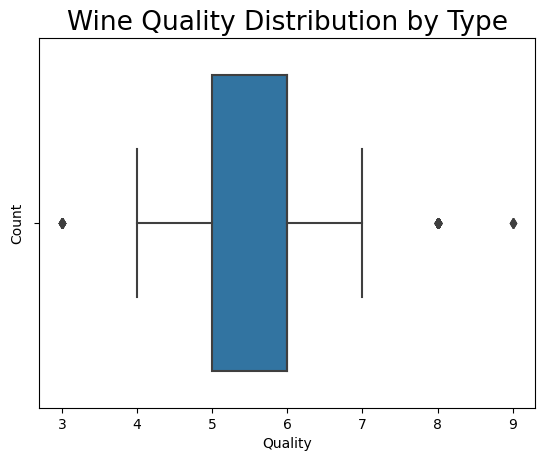

In [19]:
# Checking the distribution of the target variable 'Quality' by Type

sns.boxplot(x=z.quality, hue=z.type)
plt.title('Wine Quality Distribution by Type', fontsize=19)
plt.ylabel('Count')
plt.xlabel('Quality')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

Text(0.5, 0, 'Quality')

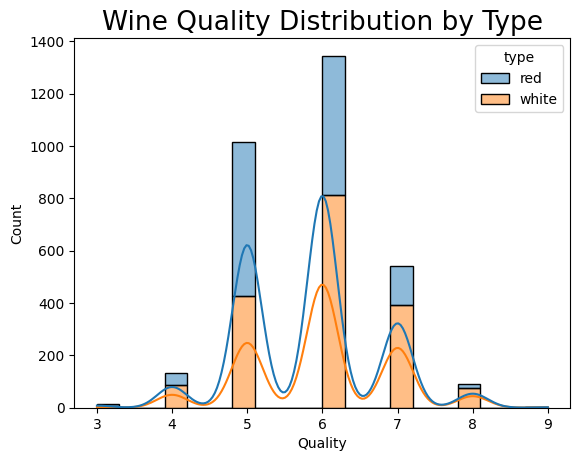

In [20]:
# Checking the distribution of the target variable 'Quality' by Type

sns.histplot(x=z.quality, hue=z.type, bins=20, kde=True, multiple='stack')
plt.title('Wine Quality Distribution by Type', fontsize=19)
plt.ylabel('Count')
plt.xlabel('Quality')

In [21]:
# Drop categorical variable to run correlation

z2 = z.drop('type', axis=1)

# Run correlation table

corr= z2.corr()


Text(0.5, 1.0, 'Wine Correlation Heat Map')

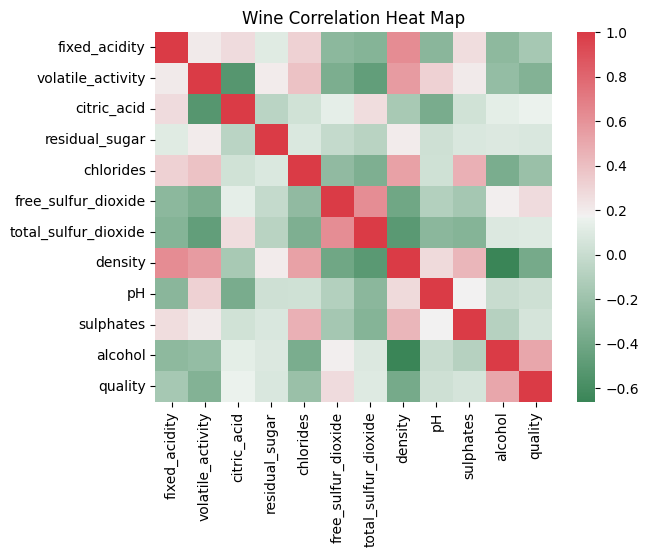

In [22]:
# Make correlation heat map
# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

sns.heatmap(corr, cmap=cmap)
plt.title('Wine Correlation Heat Map')

In [23]:
# Wine Quality Correlation
# Top 3: Alcohol, Free Sulfur Dioxide, Citric Acid
# Bottom 3: Density, Volatile Activity, Chlorides

print('\nWine Quality Correlations Sorted: \n')
print(corr['quality'].sort_values(ascending=False))



Wine Quality Correlations Sorted: 

quality                 1.000000
alcohol                 0.506969
free_sulfur_dioxide     0.268535
citric_acid             0.157989
total_sulfur_dioxide    0.098717
residual_sugar          0.072992
sulphates               0.056488
pH                      0.021752
fixed_acidity          -0.160528
chlorides              -0.219614
volatile_activity      -0.318096
density                -0.376687
Name: quality, dtype: float64


Text(0, 0.5, 'Alcohol Content')

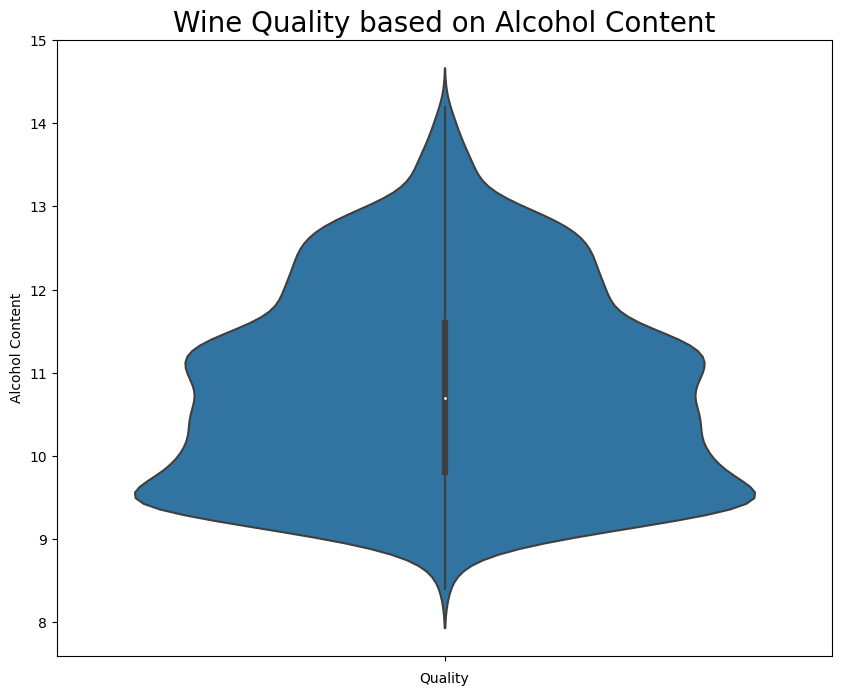

In [24]:
# The higher the alcohol content the higher the perceived quality

plt.figure(figsize=(10,8))
sns.violinplot(y=z.alcohol, hue=z.quality)
plt.title('Wine Quality based on Alcohol Content', fontsize=20)
plt.xlabel('Quality')
plt.ylabel('Alcohol Content')
#plt.axhline(y=12.15)

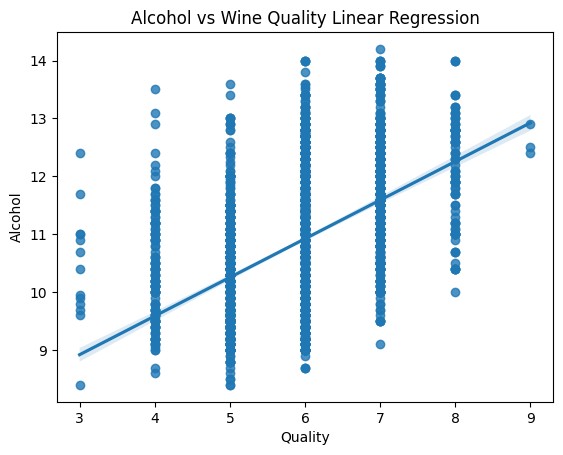

In [25]:
# Strong positive linear relationship with Alcohol and Wine Quality

sns.regplot(x=z.quality, y=z.alcohol)
plt.title('Alcohol vs Wine Quality Linear Regression')
plt.xlabel('Quality')
plt.ylabel('Alcohol')
plt.show()

Text(0.5, 0, 'Quality')

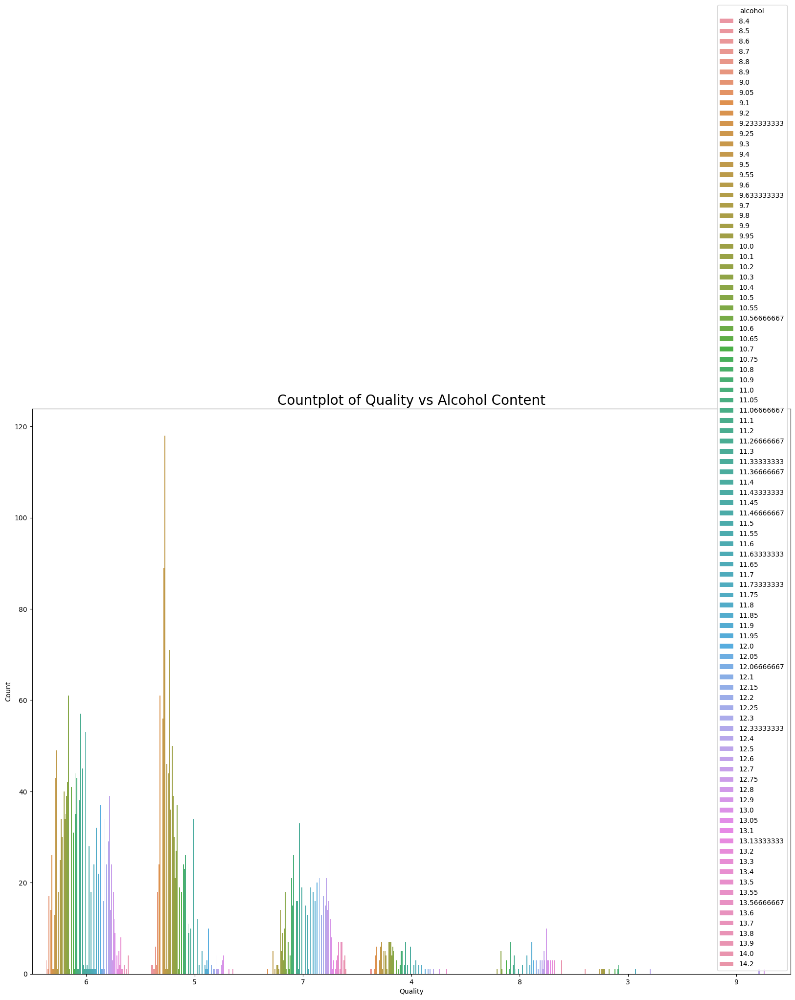

In [26]:
# Based on this graph, alcohol content alone cannot determine a high quality wine

plt.figure(figsize=(20,15))
sns.countplot(x=z.quality, order=z['quality'].value_counts().index, hue=z.alcohol)
plt.title('Countplot of Quality vs Alcohol Content', fontsize=20)
plt.ylabel('Count')
plt.xlabel('Quality')

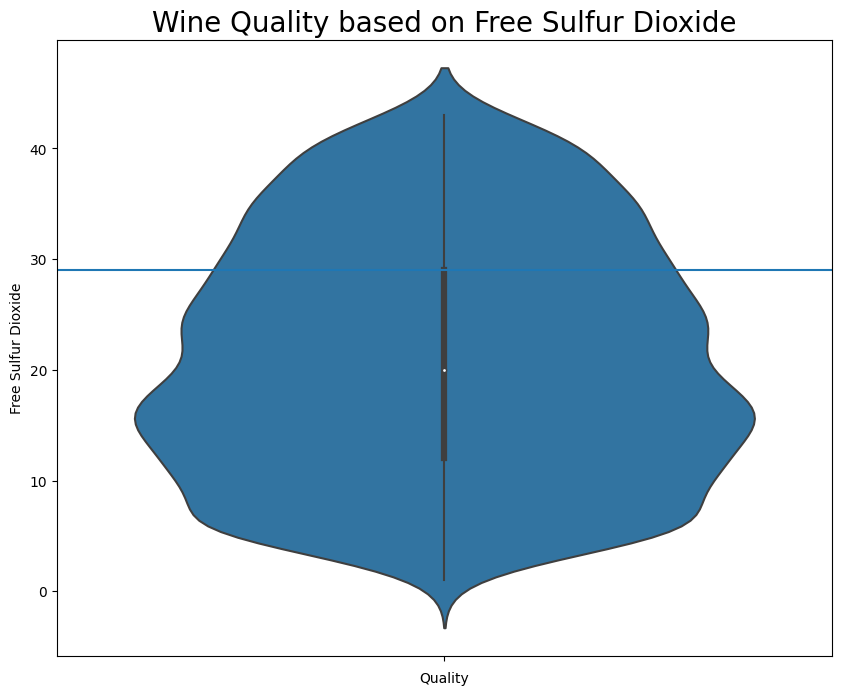

In [27]:
# Wine quality seems to trend with higher levels of Free Sulfur Dioxide
# The sweet spot seems to be 29 units before quality begins to tapper off

plt.figure(figsize=(10,8))
sns.violinplot(y=z.free_sulfur_dioxide, hue=z.quality)
plt.title('Wine Quality based on Free Sulfur Dioxide', fontsize=20)
plt.xlabel('Quality')
plt.ylabel('Free Sulfur Dioxide')
plt.axhline(y=29)

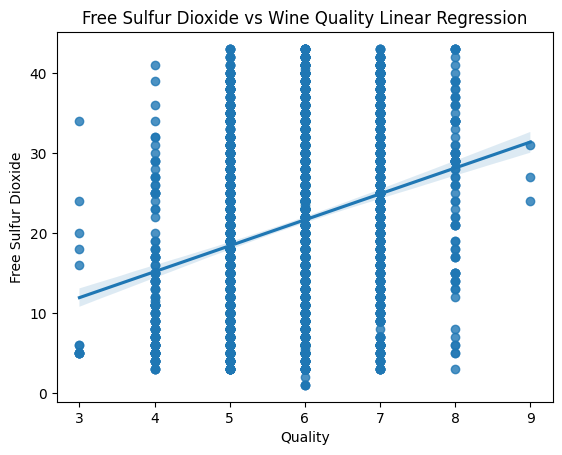

In [28]:
# Strong positive linear relationship with Free Sulfur Dioxide and Wine Quality

sns.regplot(x=z.quality, y=z.free_sulfur_dioxide)
plt.title('Free Sulfur Dioxide vs Wine Quality Linear Regression')
plt.xlabel('Quality')
plt.ylabel('Free Sulfur Dioxide')
plt.show()

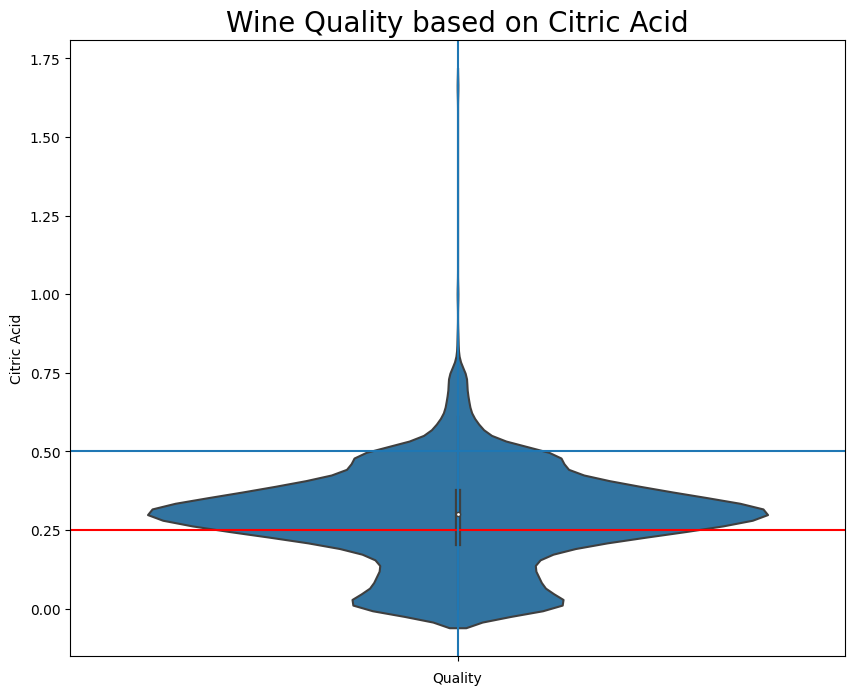

In [29]:
# Citric Acid needs to be between 0.25 to 0.50 for a quality of >6

plt.figure(figsize=(10,8))
sns.violinplot(y=z.citric_acid, hue=z.quality)
plt.title('Wine Quality based on Citric Acid', fontsize=20)
plt.xlabel('Quality')
plt.ylabel('Citric Acid')
plt.axhline(y=0.50)
plt.axhline(y=0.25, color='red')
plt.axvline(x=0)

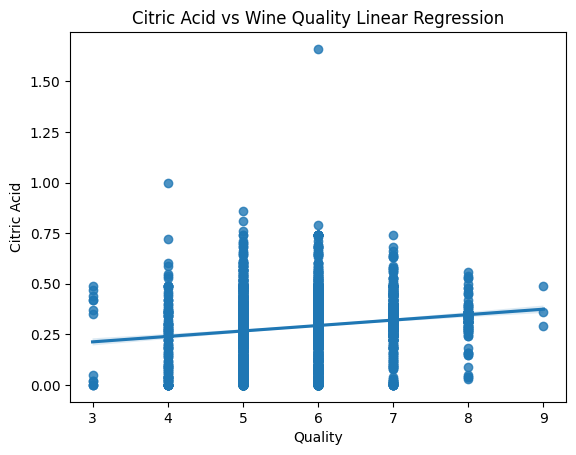

In [30]:
# Weak positive linear relationship with Citric Acid and Wine Quality

sns.regplot(x=z.quality, y=z.citric_acid)
plt.title('Citric Acid vs Wine Quality Linear Regression')
plt.xlabel('Quality')
plt.ylabel('Citric Acid')
plt.show()

Text(0, 0.5, 'Density')

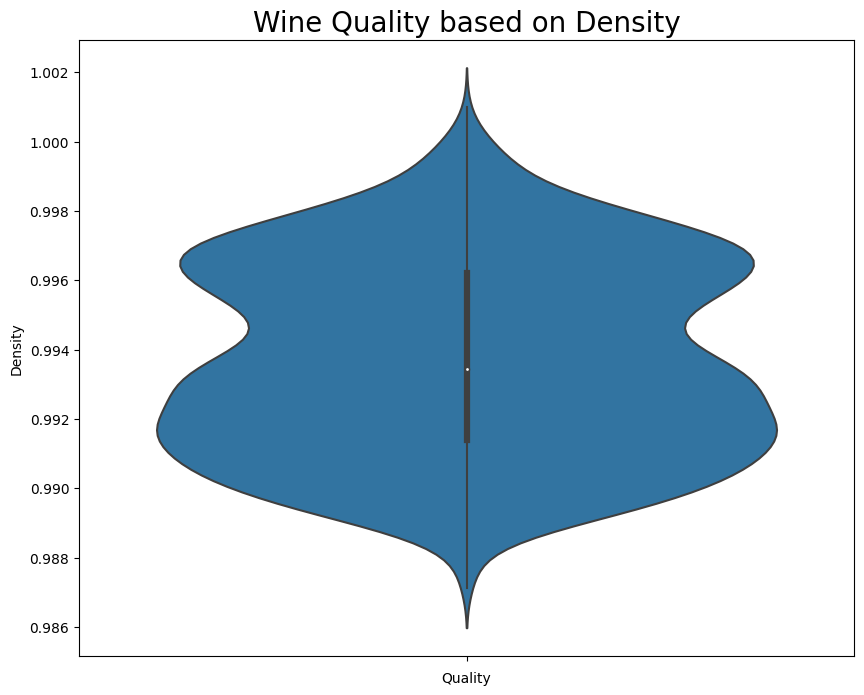

In [31]:
# Quality seems to have a negative correlation with Density
# Lower the density the higher the quality

plt.figure(figsize=(10,8))
sns.violinplot(y=z.density, hue=z.quality)
plt.title('Wine Quality based on Density', fontsize=20)
plt.xlabel('Quality')
plt.ylabel('Density')
#plt.axhline(y=0.36)
#plt.axhline(y=0.25, color='red')
#plt.axvline(x=0)

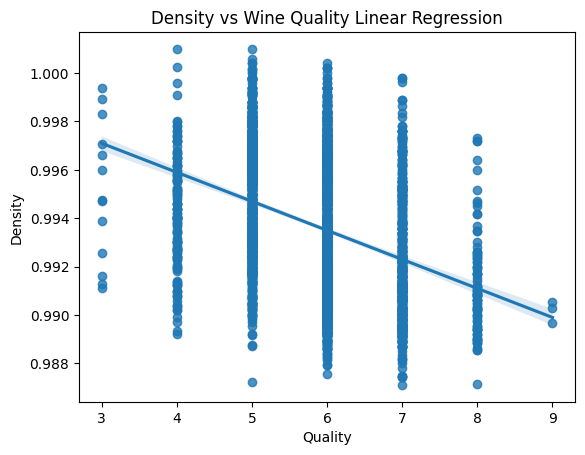

In [32]:
# Strong negative linear relationship with Density and Wine Quality

sns.regplot(x=z.quality, y=z.density)
plt.title('Density vs Wine Quality Linear Regression')
plt.xlabel('Quality')
plt.ylabel('Density')
plt.show()

Text(0, 0.5, 'Density')

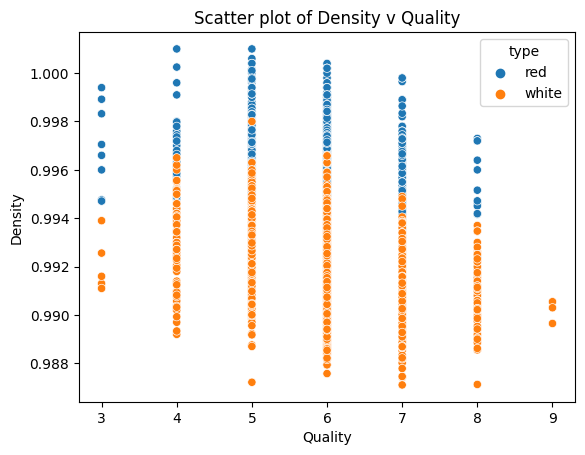

In [33]:
# When looking at type, Red Wines seem to have a higher density
# than White Wines

sns.scatterplot(x=z.quality, y=z.density, hue=z.type)
plt.title('Scatter plot of Density v Quality')
plt.xlabel('Quality')
plt.ylabel('Density')

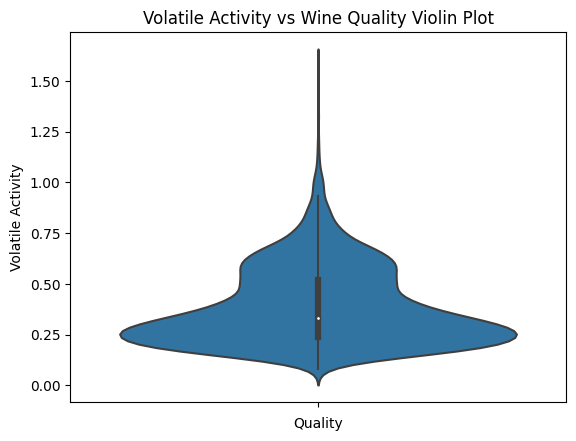

In [34]:
# Moderate negative trend with Volatile Activity and Wine Quality

sns.violinplot(y=z.volatile_activity, hue=z.quality)
plt.title('Volatile Activity vs Wine Quality Violin Plot')
plt.xlabel('Quality')
plt.ylabel('Volatile Activity')
plt.show()

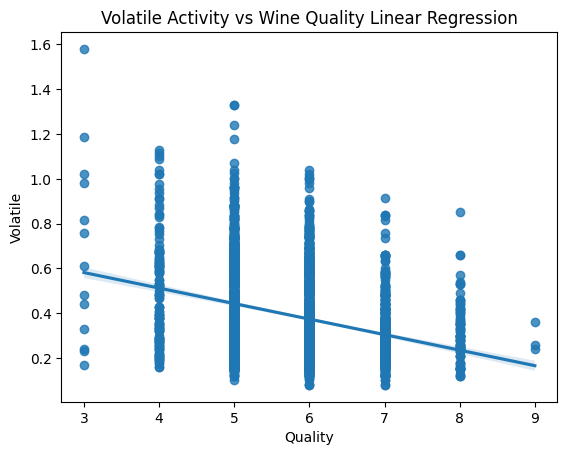

In [35]:
# Moderate negative linear relationship with Volatile Activity and Wine Quality

sns.regplot(x=z.quality, y=z.volatile_activity)
plt.title('Volatile Activity vs Wine Quality Linear Regression')
plt.xlabel('Quality')
plt.ylabel('Volatile')
plt.show()

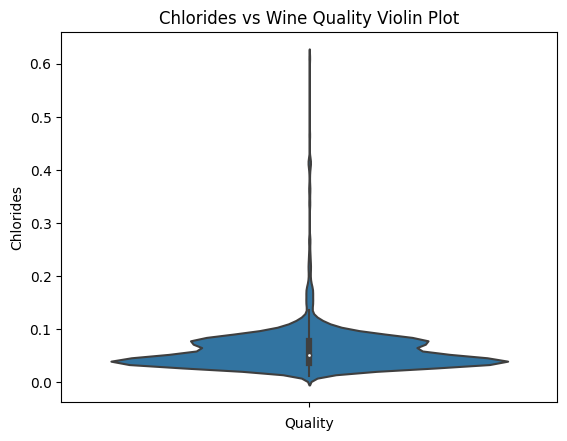

In [36]:
# Moderate negative trend with Chlorides and Wine Quality
# Chlorides also seem to have strong outliers ratings 4-7

sns.violinplot(y=z.chlorides, hue=z.quality)
plt.title('Chlorides vs Wine Quality Violin Plot')
plt.xlabel('Quality')
plt.ylabel('Chlorides')
plt.show()

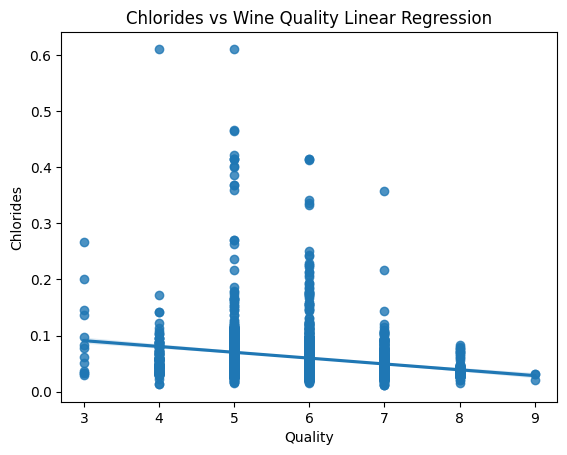

In [37]:
# Weak negative linear relationship with Chlorides and Wine Quality

sns.regplot(x=z.quality, y=z.chlorides)
plt.title('Chlorides vs Wine Quality Linear Regression')
plt.xlabel('Quality')
plt.ylabel('Chlorides')
plt.show()

In [38]:
# Split dataset to create correlations and heatmaps for both Red and White wine

red = z[z['type']=='red']
white = z[z['type']=='white']


In [39]:
# Drop categorical variable to create correlation chart and heatmap

red = red.drop('type', axis=1)
print('Red Wine Correlation: ')
red.corr()

Red Wine Correlation: 


,fixed_acidity,volatile_activity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
fixed_acidity,1.000000,-0.189175,0.570304,0.185712,0.131749,-0.099780,-0.018511,0.583705,-0.645079,0.135688,-0.143224,0.064975
volatile_activity,-0.189175,1.000000,-0.550768,0.065886,0.053342,-0.039128,0.070350,0.101296,0.195424,-0.249554,-0.218629,-0.389291
citric_acid,0.570304,-0.550768,1.000000,0.096685,0.256082,-0.001641,0.091563,0.210794,-0.456681,0.315606,0.081710,0.198363
residual_sugar,0.185712,0.065886,0.096685,1.000000,0.024844,0.051557,0.106506,0.336056,-0.032781,-0.019664,0.071537,-0.012522
chlorides,0.131749,0.053342,0.256082,0.024844,1.000000,-0.046719,0.042333,0.212284,-0.309659,0.402201,-0.233063,-0.131480
free_sulfur_dioxide,-0.099780,-0.039128,-0.001641,0.051557,-0.046719,1.000000,0.643227,-0.030680,0.024731,0.056898,-0.041317,-0.026324
total_sulfur_dioxide,-0.018511,0.070350,0.091563,0.106506,0.042333,0.643227,1.000000,0.126287,-0.128345,0.050502,-0.232157,-0.188361
density,0.583705,0.101296,0.210794,0.336056,0.212284,-0.030680,0.126287,1.000000,-0.220611,0.096806,-0.630021,-0.276705
pH,-0.645079,0.195424,-0.456681,-0.032781,-0.309659,0.024731,-0.128345,-0.220611,1.000000,-0.186922,0.247744,-0.011834
sulphates,0.135688,-0.249554,0.315606,-0.019664,0.402201,0.056898,0.050502,0.096806,-0.186922,1.000000,0.099051,0.241164


Text(0.5, 1.0, 'Red Wine Correlation Heat Map')

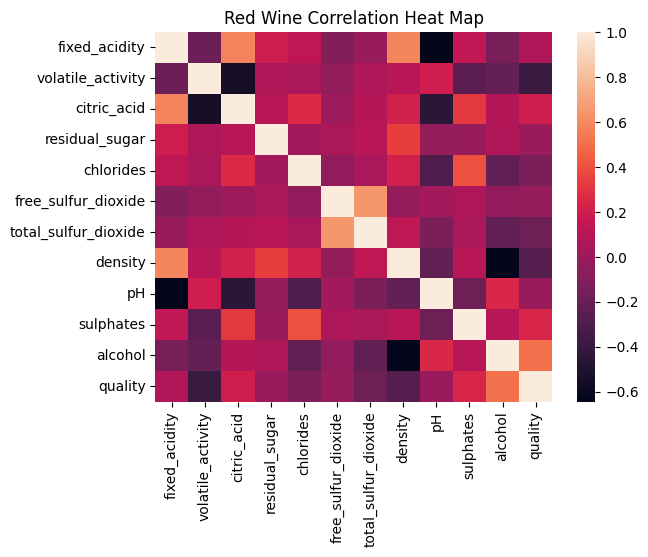

In [40]:
# Red Wine Correlation Heat Map

sns.heatmap(red.corr())
plt.title('Red Wine Correlation Heat Map')

In [41]:
# Red Wine Quality Correlation
# Top 3 Alcohol, Sulphates, Citric Acid
# Bottom 3 Volatile Activity, Density, Total Sulfur Dioxide

red_corr = red.corr()
print('\nRed Wine Correlations Sorted: \n')
print(red_corr['quality'].sort_values(ascending=False))



Red Wine Correlations Sorted: 

quality                 1.000000
alcohol                 0.506898
sulphates               0.241164
citric_acid             0.198363
fixed_acidity           0.064975
pH                     -0.011834
residual_sugar         -0.012522
free_sulfur_dioxide    -0.026324
chlorides              -0.131480
total_sulfur_dioxide   -0.188361
density                -0.276705
volatile_activity      -0.389291
Name: quality, dtype: float64


<Axes: xlabel='quality', ylabel='alcohol'>

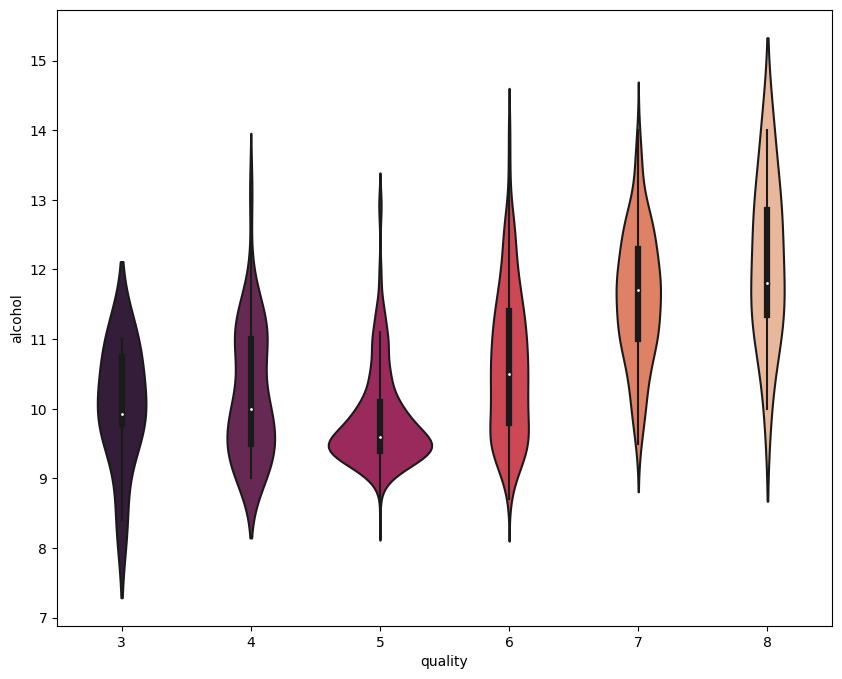

In [42]:
# Display relationship that Red wine Quality has with Alcohol content

plt.figure(figsize=(10,8))
sns.color_palette("rocket", as_cmap=True)
sns.violinplot(x= red.quality, y=red.alcohol, palette='rocket')

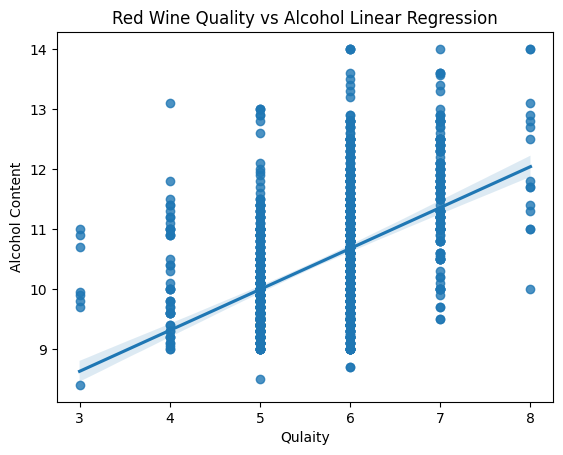

In [43]:
# Shows strong positive linear relationship between alcohol and red wine quality

sns.regplot(y=red.alcohol, x=red.quality)
plt.title('Red Wine Quality vs Alcohol Linear Regression')
plt.ylabel('Alcohol Content')
plt.xlabel('Qulaity')
plt.show()

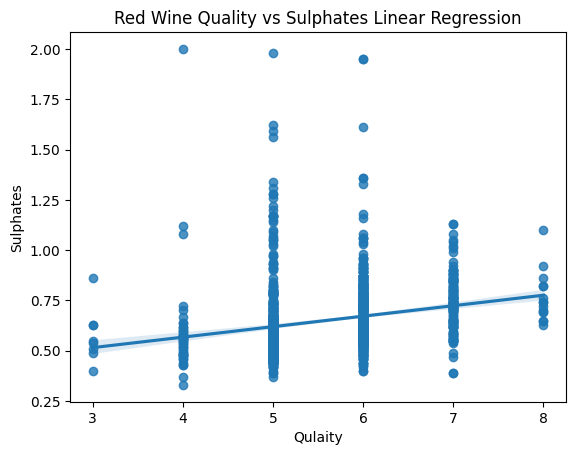

In [44]:
# Shows weak positive linear relationship between sulphates and red wine quality

sns.regplot(y=red.sulphates, x=red.quality)
plt.title('Red Wine Quality vs Sulphates Linear Regression')
plt.ylabel('Sulphates')
plt.xlabel('Qulaity')
plt.show()

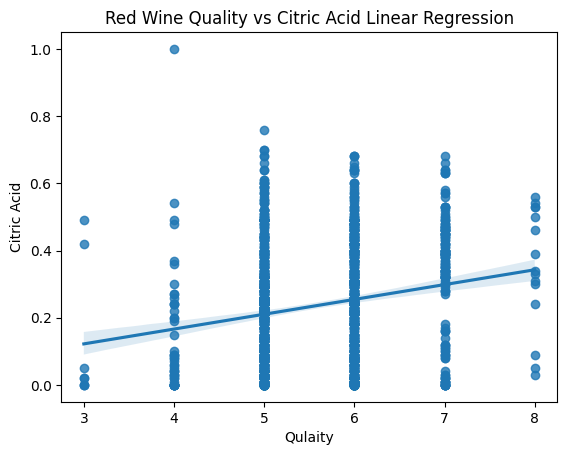

In [45]:
# Shows moderate positive linear relationship between citric acid and red wine quality

sns.regplot(y=red.citric_acid, x=red.quality)
plt.title('Red Wine Quality vs Citric Acid Linear Regression')
plt.ylabel('Citric Acid')
plt.xlabel('Qulaity')
plt.show()

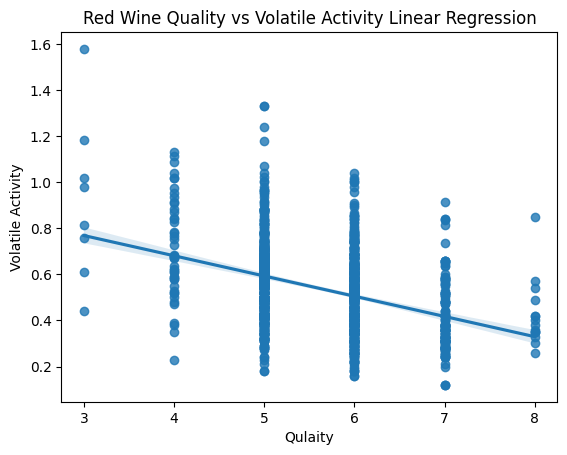

In [46]:
# Shows strong negative linear relationship between volatile activity and red wine quality

sns.regplot(y=red.volatile_activity, x=red.quality)
plt.title('Red Wine Quality vs Volatile Activity Linear Regression')
plt.ylabel('Volatile Activity')
plt.xlabel('Qulaity')
plt.show()

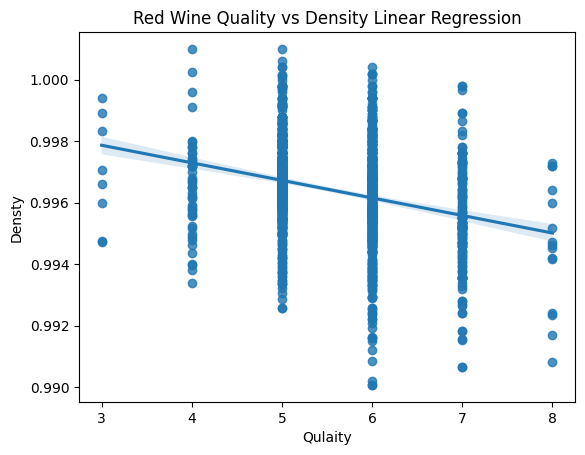

In [47]:
# Shows strong negative linear relationship between density and red wine quality

sns.regplot(y=red.density, x=red.quality)
plt.title('Red Wine Quality vs Density Linear Regression')
plt.ylabel('Densty')
plt.xlabel('Qulaity')
plt.show()

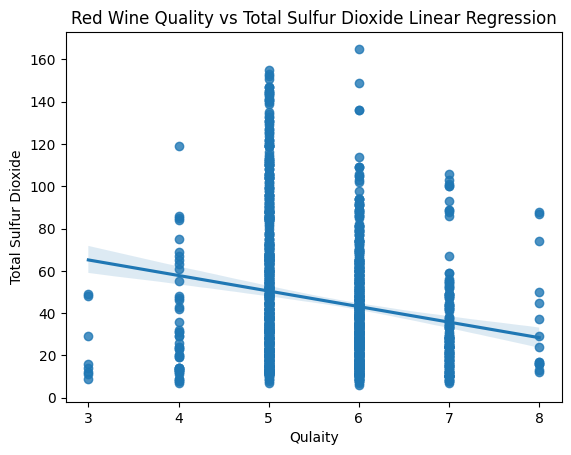

In [48]:
# Shows strong negative linear relationship between Total Sulfur Dioxide and Red Wine Quality

sns.regplot(y=red.total_sulfur_dioxide, x=red.quality)
plt.title('Red Wine Quality vs Total Sulfur Dioxide Linear Regression')
plt.ylabel('Total Sulfur Dioxide')
plt.xlabel('Qulaity')
plt.show()

In [49]:
# Drop categorical variable to create White Wine correlation chart and heatmap

white = white.drop('type', axis=1)
print('White Wine Correlation: ')
white.corr()

White Wine Correlation: 


,fixed_acidity,volatile_activity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
fixed_acidity,1.000000,-0.108207,0.319115,-0.042093,0.051811,-0.096189,0.087727,0.430683,-0.480211,-0.048653,-0.180001,-0.209994
volatile_activity,-0.108207,1.000000,-0.316464,0.180922,0.036035,-0.138494,0.042497,-0.066955,-0.033199,-0.091732,0.109005,-0.132367
citric_acid,0.319115,-0.316464,1.000000,-0.100274,0.188522,0.015808,0.066267,0.088426,-0.130582,0.027929,0.015145,0.023126
residual_sugar,-0.042093,0.180922,-0.100274,1.000000,-0.042474,0.059984,0.066314,0.023948,-0.049969,0.008414,0.175851,0.158813
chlorides,0.051811,0.036035,0.188522,-0.042474,1.000000,-0.023263,0.139355,0.332514,-0.095256,0.004370,-0.358902,-0.189724
free_sulfur_dioxide,-0.096189,-0.138494,0.015808,0.059984,-0.023263,1.000000,0.376423,-0.138298,0.115792,0.060550,0.137255,0.342811
total_sulfur_dioxide,0.087727,0.042497,0.066267,0.066314,0.139355,0.376423,1.000000,0.275121,0.075424,0.089967,-0.167110,0.005064
density,0.430683,-0.066955,0.088426,0.023948,0.332514,-0.138298,0.275121,1.000000,0.065959,0.111560,-0.841911,-0.429896
pH,-0.480211,-0.033199,-0.130582,-0.049969,-0.095256,0.115792,0.075424,0.065959,1.000000,0.175804,0.042625,0.179599
sulphates,-0.048653,-0.091732,0.027929,0.008414,0.004370,0.060550,0.089967,0.111560,0.175804,1.000000,0.031183,0.130943


Text(0.5, 1.0, 'White Wine Correlation Heat Map')

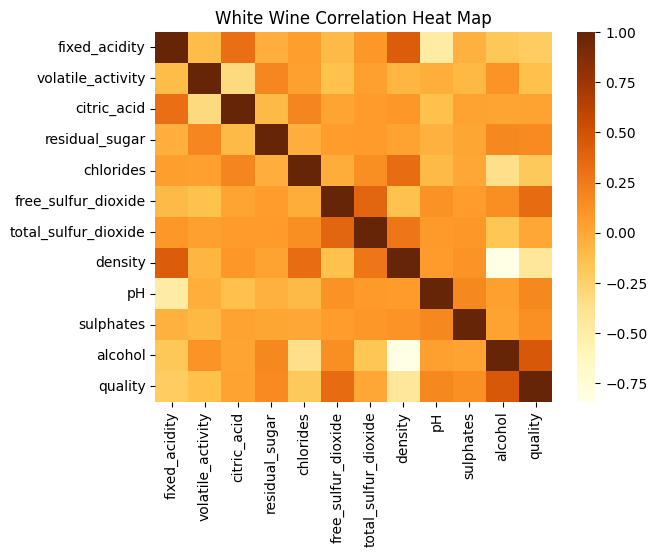

In [50]:
# White Wine Correlation Heat Map

sns.heatmap(white.corr(),cmap='YlOrBr')
plt.title('White Wine Correlation Heat Map')

In [51]:
# White Wine Quality Correlation
# Top 3 Alcohol, Free Sulfur Dioxide, pH
# Bottom 3 Density, Fixed Acidity, Chlorides

white_corr = white.corr()
print('\nWhite Wine Correlations Sorted: \n')
print(white_corr['quality'].sort_values(ascending=False))



White Wine Correlations Sorted: 

quality                 1.000000
alcohol                 0.461891
free_sulfur_dioxide     0.342811
pH                      0.179599
residual_sugar          0.158813
sulphates               0.130943
citric_acid             0.023126
total_sulfur_dioxide    0.005064
volatile_activity      -0.132367
chlorides              -0.189724
fixed_acidity          -0.209994
density                -0.429896
Name: quality, dtype: float64


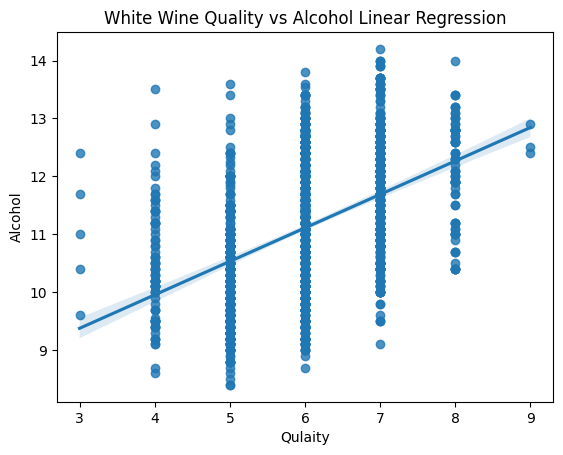

In [52]:
# Shows strong positive linear relationship between alcohol and white wine quality
# displays a stronger positive relation than red wine

sns.regplot(y=white.alcohol, x=white.quality)
plt.title('White Wine Quality vs Alcohol Linear Regression')
plt.ylabel('Alcohol')
plt.xlabel('Qulaity')
plt.show()

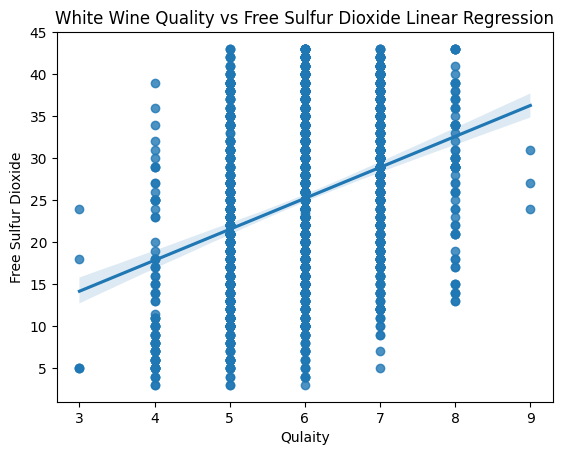

In [53]:
# Shows strong positive linear relationship between free sulfur dioxide and white wine quality

sns.regplot(y=white.free_sulfur_dioxide, x=white.quality)
plt.title('White Wine Quality vs Free Sulfur Dioxide Linear Regression')
plt.ylabel('Free Sulfur Dioxide')
plt.xlabel('Qulaity')
plt.show()

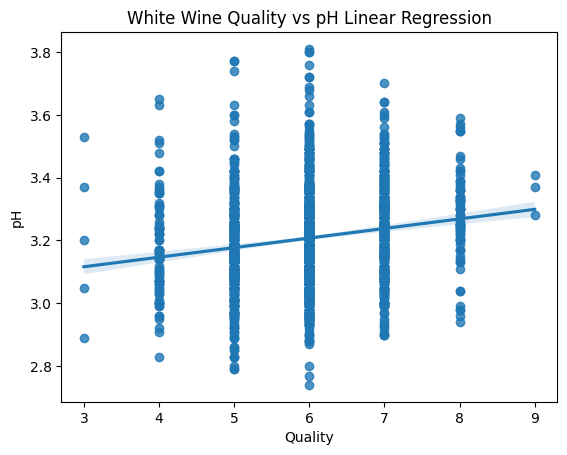

In [54]:
# Shows moderate positive linear relationship between pH and red wine quality

sns.regplot(y=white.pH, x=white.quality)
plt.title('White Wine Quality vs pH Linear Regression')
plt.ylabel('pH')
plt.xlabel('Quality')
plt.show()

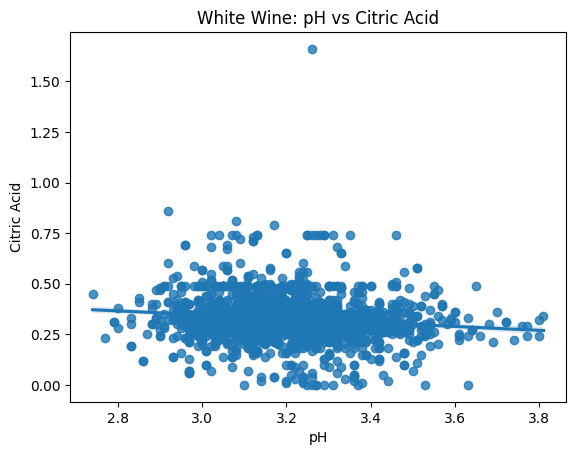

In [55]:
# There is a weak negative correlation between pH and citric acid in White wines
sns.regplot(x=white.pH, y=white.citric_acid)
plt.title('White Wine: pH vs Citric Acid')
plt.ylabel('Citric Acid')
plt.xlabel('pH')
plt.show()

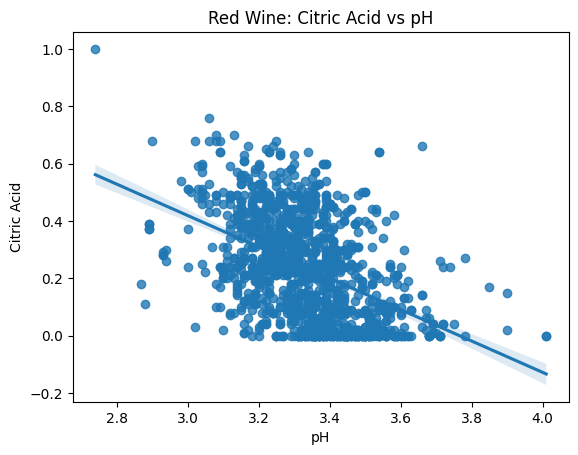

In [56]:
# Red wine has a stronger negative linear relationship between Citric Acid and
# pH

sns.regplot(x=red.pH, y=red.citric_acid)
plt.title('Red Wine: Citric Acid vs pH')
plt.xlabel('pH')
plt.ylabel('Citric Acid')
plt.show()

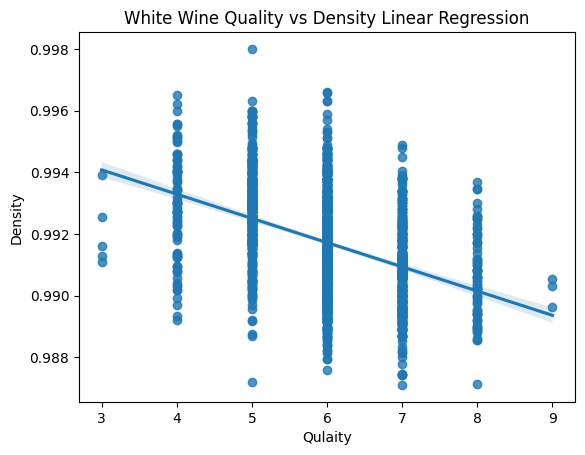

In [57]:
# Shows strong negative linear relationship between density and white wine quality

sns.regplot(y=white.density, x=white.quality)
plt.title('White Wine Quality vs Density Linear Regression')
plt.ylabel('Density')
plt.xlabel('Qulaity')
plt.show()

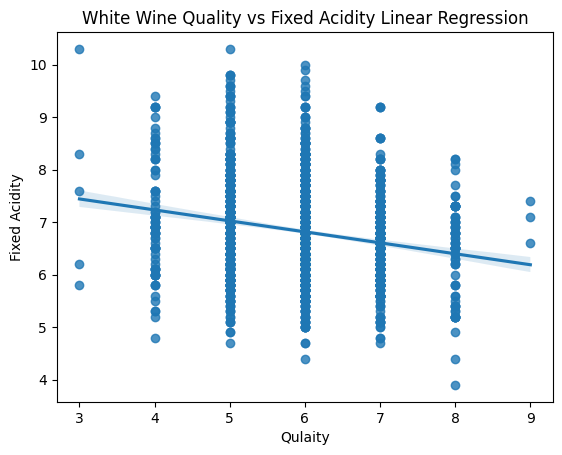

In [58]:
# Shows strong negative linear relationship between fixed acidity and white wine quality

sns.regplot(y=white.fixed_acidity, x=white.quality)
plt.title('White Wine Quality vs Fixed Acidity Linear Regression')
plt.ylabel('Fixed Acidity')
plt.xlabel('Qulaity')
plt.show()

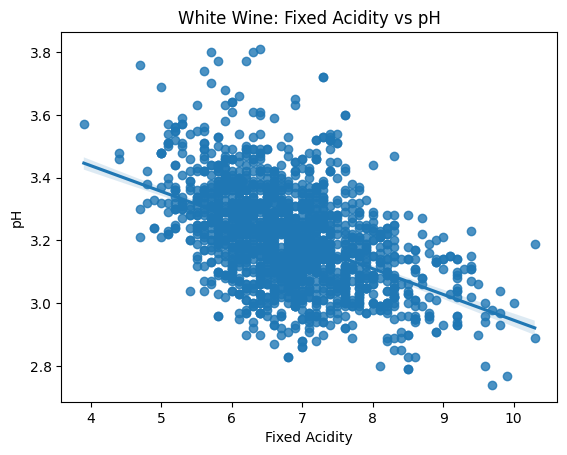

In [59]:
# Fixed Acidity and pH also have a strong negative relationship in White Wine

sns.regplot(x=white.fixed_acidity, y=white.pH)
plt.title('White Wine: Fixed Acidity vs pH')
plt.xlabel('Fixed Acidity')
plt.ylabel('pH')
plt.show()

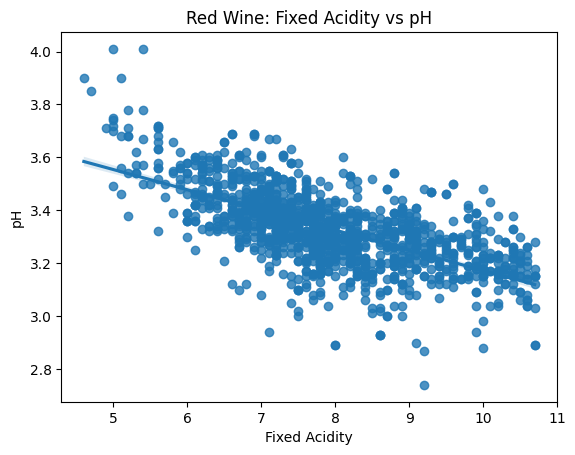

In [60]:
# This relationship is stronger in Red Wine

sns.regplot(x=red.fixed_acidity, y=red.pH)
plt.title('Red Wine: Fixed Acidity vs pH')
plt.xlabel('Fixed Acidity')
plt.ylabel('pH')
plt.show()

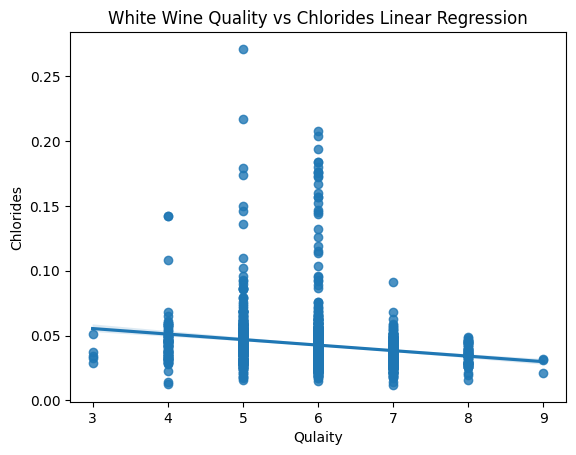

In [61]:
# Shows weak negative linear relationship between density and red wine quality

sns.regplot(y=white.chlorides, x=white.quality)
plt.title('White Wine Quality vs Chlorides Linear Regression')
plt.ylabel('Chlorides')
plt.xlabel('Qulaity')
plt.show()

In [62]:
from scipy.stats import ttest_ind

# Creating variables to conduct Ttests against Quality
# These Ttest will be conducted to confirm whether the 6 variables above have a statsitically significant
#   relationship with Wine quality

# Red Wine
# Top 3
r_alcohol = red[['alcohol']]
r_sulphates = red[['sulphates']]
r_citric_acid = red[['citric_acid']]

# Bottom 3
r_volatile_activity = red[['volatile_activity']]
r_density = red[['density']]
r_total_sulfur_dioxide = red[['total_sulfur_dioxide']]





# White Wine
# Top 3
w_alcohol = white[['alcohol']]
w_free_sulfur_dioxide = white[['free_sulfur_dioxide']]
w_pH = white[['pH']]

# Bottom 3
w_density = white[['density']]
w_fixed_acidity = white[['fixed_acidity']]
w_chlorides = white[['chlorides']]

# Common variables to test
w_sulphates = white[['sulphates']]
w_citric_acid = white[['citric_acid']]
w_volatile_activity = white[['volatile_activity']]
w_total_sulfur_dioxide = white[['total_sulfur_dioxide']]
r_free_sulfur_dioxide = red[['free_sulfur_dioxide']]
r_pH = red[['pH']]
r_fixed_acidity = red[['fixed_acidity']]
r_chlorides = red[['chlorides']]





In [63]:
# Top 3 Red Wine Quality correlates t-tested against White wine for statistical significance

t_stats, p_value = ttest_ind(r_alcohol, w_alcohol)
print('\nAlcohol Content: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on Alcohol Content
# Ha: There is a difference between Red and White wine quality based on Alcohol Content
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on Alcohol content


Alcohol Content: Red Wine vs White Wine
T-Statistics: [-17.03205891], p-value: [2.74174013e-62]


In [64]:
# Top 3 Red Wine Quality correlates t-tested against White wine for statistical significance

t_stats, p_value = ttest_ind(r_sulphates, w_sulphates)
print('\nSulphates Content: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on Sulphates
# Ha: There is a difference between Red and White wine quality based on Sulphates
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on Sulphates


Sulphates Content: Red Wine vs White Wine
T-Statistics: [30.55494586], p-value: [9.67349123e-180]


In [65]:
# Top 3 Red Wine Quality correlates t-tested against White wine for statistical significance

t_stats, p_value = ttest_ind(r_citric_acid, w_citric_acid)
print('\nCitric Acid: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on Citric Acid
# Ha: There is a difference between Red and White wine quality based on Citric Acid
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on Citric Acid


Citric Acid: Red Wine vs White Wine
T-Statistics: [-17.15001931], p-value: [4.30781802e-63]


In [66]:
# Bottom 3 Red Wine Quality correlates t-tested against White wine for statistical significance

t_stats, p_value = ttest_ind(r_volatile_activity, w_volatile_activity)
print('\nVolatile Activity: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on Volatile Activity
# Ha: There is a difference between Red and White wine quality based on Volatile Activity
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on Volatile Activity


Volatile Activity: Red Wine vs White Wine
T-Statistics: [52.41780846], p-value: [0.]


In [67]:
# Bottom 3 Red Wine Quality correlates t-tested against White wine for statistical significance

t_stats, p_value = ttest_ind(r_density, w_density)
print('\nDensity: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on Density
# Ha: There is a difference between Red and White wine quality based on Density
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on Density


Density: Red Wine vs White Wine
T-Statistics: [76.94609734], p-value: [0.]


In [68]:
# Bottom 3 Red Wine Quality correlates t-tested against White wine for statistical significance

t_stats, p_value = ttest_ind(r_total_sulfur_dioxide, w_total_sulfur_dioxide)
print('\nTotal Sulfur Dioxide: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on Total Sulfur Dioxide
# Ha: There is a difference between Red and White wine quality based on Total Sulfur Dioxide
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on Total Sulfur Dioxide


Total Sulfur Dioxide: Red Wine vs White Wine
T-Statistics: [-60.09413646], p-value: [0.]


In [69]:
# Top 3 White Wine (Alcohol has already been tested)

t_stats, p_value = ttest_ind(r_free_sulfur_dioxide, w_free_sulfur_dioxide)
print('\nFree Sulfur Dioxide: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on Free Sulfur Dioxide
# Ha: There is a difference between Red and White wine quality based on Free Sulfur Dioxide
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on Free Sulfur Dioxide


Free Sulfur Dioxide: Red Wine vs White Wine
T-Statistics: [-27.35448635], p-value: [5.92997492e-148]


In [70]:
# Top 3 White Wine (Alcohol has already been tested)

t_stats, p_value = ttest_ind(r_pH, w_pH)
print('\npH: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on pH
# Ha: There is a difference between Red and White wine quality based on pH
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on pH



pH: Red Wine vs White Wine
T-Statistics: [22.69958011], p-value: [9.41589487e-106]


In [71]:
# Bottom 3 White Wine (Density was already tested)

t_stats, p_value = ttest_ind(r_fixed_acidity, w_fixed_acidity)
print('\nFixed Acidity: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on Fixed Acidity
# Ha: There is a difference between Red and White wine quality based on Fixed Acidity
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on Fixed Acidity


Fixed Acidity: Red Wine vs White Wine
T-Statistics: [28.17710806], p-value: [6.29201538e-156]


In [72]:
# Bottom 3 White Wine
t_stats, p_value = ttest_ind(r_chlorides, w_chlorides)
print('\nChlorides: Red Wine vs White Wine')
print(f'T-Statistics: {t_stats}, p-value: {p_value}')

# H0: There is no difference between Red and White wine quality based on Chlorides
# Ha: There is a difference between Red and White wine quality based on Chlorides
# Rejected the null hypothesis. There is a significant difference between Red and White wine
#   based on Chlorides


Chlorides: Red Wine vs White Wine
T-Statistics: [34.13838499], p-value: [1.6237969e-217]


## Findings:
* There is a statistically significant difference between Red and White Wine correlates in their relation to their Wine Quality rating (0-10).

### Red Wine:
* **Top 3 Red Wine Correlates:**
    * Alcohol
        * Tstat: -17.03
        * p-value: 2.74e-62
    * Sulphates
        * Tstat: 30.55
        * p-value: 9.67e-180
    * Citric Acid
        * Tstat: -17.15
        * p-value: 4.30e-63

* **Bottom 3 Red Wine Correlates:**
    * Volatile Activiy
        * Tstat: 52.41
        * p-value: 0
    * Density
        * Tstat: 76.94
        * p-value: 0
    * Total Sulfur Dioxide
        * Tstat: -60.09
        * p-value: 0

### White Wine:
* **Top 3 White Wine Correlates:**
    * Alcohol
        * Tstat: 17.03
        * p-value: 2.74e-62
    * Free Sulfur Dioxide
        * Tstat: -27.69
        * p-value: 5.92e-148
    * pH
        * Tstat: 22.69
        * p-value: 9.41e-106

* **Bottom 3 White Wine Correlates:**
    * Density
        * Tstat: -76.94
        * p-value: 0
    * Fixed Acidity
        * Tstat: 28.17
        * p-value: 6.29e-156
    * Chlorides
        * Tstat: 34.13
        * p-value: 1.62e-217

## High Quality Wine Analysis
* Red Wine
  * Quality Score: 5 to 8

* White Wine
  * Quality Score: 5 to 9


In [73]:
# Impute red wine quality to the designated scores
red['high_qual'] = red['quality'].isin([8,7,6,5])

# Impute white wine quality to deisgnated scores

white['high_qual'] = white['quality'].isin([9,8,7,6,5])

# Confirm the value counts of the new variable
print(red['high_qual'].value_counts())
print()
print(white['high_qual'].value_counts())
print()
# Create boolean mask
red_high = red['high_qual']
red_high = red[red_high]

white_high = white['high_qual']
white_high = white[white_high]

# Confirm value counts
print('Red Wine High Quality Count:')
print(red_high['quality'].value_counts())
print('\nWhite Wine High Quality Count')
print(white_high['quality'].value_counts())

high_qual
True     1286
False      55
Name: count, dtype: int64

high_qual
True     1711
False      90
Name: count, dtype: int64

Red Wine High Quality Count:
quality
5    589
6    534
7    148
8     15
Name: count, dtype: int64

White Wine High Quality Count
quality
6    811
5    427
7    394
8     76
9      3
Name: count, dtype: int64


In [74]:
# Red Wine High Quality Correlation Sorted

red_corr_high = red_high.corr()
print('\nHigh Quality Red Wine Correlations Sorted: \n')
print(red_corr_high['quality'].sort_values(ascending=False))


High Quality Red Wine Correlations Sorted: 

quality                 1.000000
alcohol                 0.557366
sulphates               0.245279
citric_acid             0.173600
fixed_acidity           0.054560
pH                      0.036434
residual_sugar          0.011113
free_sulfur_dioxide    -0.074737
chlorides              -0.125142
total_sulfur_dioxide   -0.264345
density                -0.304435
volatile_activity      -0.332302
high_qual                    NaN
Name: quality, dtype: float64


In [75]:
# Top 3: Alcohol, Sulphates, Citric Acid
# Bottom 3: Volatile Acitivty, Density, Total Sulfur Dioxide

# Import libraries

import scipy.stats as stats

# Create features
alcohol = red_high[['alcohol']]
sulphates = red_high[['sulphates']]
citric_acid = red_high[['citric_acid']]
volatile_activity = red_high[['volatile_activity']]
density = red_high[['density']]
total_sulfur_dioxide = red_high[['total_sulfur_dioxide']]

# Alcohol

# Calculate mean and standard error (se)
print('Red Wine Quality - Alcohol CI:')
mean_score = np.mean(alcohol)
sem = stats.sem(alcohol)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(alcohol)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')

# Sulphates

print('\nRed Wine Quality - Sulphates CI:')
mean_score = np.mean(sulphates)
sem = stats.sem(sulphates)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(sulphates)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')

# Citric Acid

print('\nRed Wine Quality - Citric Acid CI:')
mean_score = np.mean(citric_acid)
sem = stats.sem(citric_acid)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(citric_acid)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')

# Volatile Activity

print('\nRed Wine Quality - Volatile Activity CI:')
mean_score = np.mean(volatile_activity)
sem = stats.sem(volatile_activity)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(volatile_activity)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')


# Density

print('\nRed Wine Quality - Chlorides CI:')
mean_score = np.mean(density)
sem = stats.sem(density)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(density)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')

# Total Sulfur Dioxide

print('\nRed Wine Quality - Fixed Acidity CI:')
mean_score = np.mean(total_sulfur_dioxide)
sem = stats.sem(total_sulfur_dioxide)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(total_sulfur_dioxide)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')



Red Wine Quality - Alcohol CI:

Mean: 10.41408761016563, Standard Error: [0.03002366]

Confidence Interval 95: (array([10.35518684]), array([10.47298838]))

Red Wine Quality - Sulphates CI:

Mean: 0.6535614307931571, Standard Error: [0.00469257]

Confidence Interval 95: (array([0.64435548]), array([0.66276738]))

Red Wine Quality - Citric Acid CI:

Mean: 0.2409642301710731, Standard Error: [0.00488853]

Confidence Interval 95: (array([0.23137386]), array([0.2505546]))

Red Wine Quality - Volatile Activity CI:

Mean: 0.5312325038880249, Standard Error: [0.00476478]

Confidence Interval 95: (array([0.52188489]), array([0.54058011]))

Red Wine Quality - Chlorides CI:

Mean: 0.9963706143079315, Standard Error: [4.58157596e-05]

Confidence Interval 95: (array([0.99628073]), array([0.9964605]))

Red Wine Quality - Fixed Acidity CI:

Mean: 46.53343701399689, Standard Error: [0.8696832]

Confidence Interval 95: (array([44.82728224]), array([48.23959179]))


In [76]:
# White wine High Quality Correlation Sorted

white_corr_high = white_high.corr()
print('\nHigh Quality White Wine Correlations Sorted: \n')
print(white_corr_high['quality'].sort_values(ascending=False))


High Quality White Wine Correlations Sorted: 

quality                 1.000000
alcohol                 0.479110
free_sulfur_dioxide     0.260166
pH                      0.188545
residual_sugar          0.164758
sulphates               0.115439
citric_acid            -0.018815
volatile_activity      -0.032091
total_sulfur_dioxide   -0.064690
fixed_acidity          -0.206948
chlorides              -0.210482
density                -0.431094
high_qual                    NaN
Name: quality, dtype: float64


In [77]:
# Top 3: Alcohol, Free Sulfur Dioxide, pH
# Bottom 3: Density, Chlorides, Fixed Acidity

# Import libraries

import scipy.stats as stats

# Create features
alcohol = white_high[['alcohol']]
pH = white_high[['pH']]
free_sulfur_dioxide = white_high[['free_sulfur_dioxide']]
density = white_high[['density']]
chlorides = white_high[['chlorides']]
fixed_acidity = white_high[['fixed_acidity']]

# Alcohol

# Calculate mean and standard error (se)
print('White Wine Quality - Alcohol CI:')
mean_score = np.mean(alcohol)
sem = stats.sem(alcohol)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(alcohol)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')

# Free Sulfur Dioxide

print('\nWhite Wine Quality - Free Sulfur Dioxide CI:')
mean_score = np.mean(free_sulfur_dioxide)
sem = stats.sem(free_sulfur_dioxide)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(free_sulfur_dioxide)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')

# pH

print('\nWhite Wine Quality - pH CI:')
mean_score = np.mean(pH)
sem = stats.sem(pH)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(pH)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')

# Density

print('\nWhite Wine Quality - Density CI:')
mean_score = np.mean(density)
sem = stats.sem(density)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(density)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')


# Chlorides

print('\nWhite Wine Quality - Chlorides CI:')
mean_score = np.mean(chlorides)
sem = stats.sem(chlorides)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(chlorides)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')

# Fixed Acidity

print('\nWhite Wine Quality - Fixed Acidity CI:')
mean_score = np.mean(fixed_acidity)
sem = stats.sem(fixed_acidity)

print(f'\nMean: {mean_score}, Standard Error: {sem}')

# Confidence Interval (CI)

# 95% CI:
conf_int = stats.t.interval(0.95, len(fixed_acidity)-1, loc=mean_score, scale=sem)
print(f'\nConfidence Interval 95: {conf_int}')



White Wine Quality - Alcohol CI:

Mean: 11.124332748873757, Standard Error: [0.02794098]

Confidence Interval 95: (array([11.06953064]), array([11.17913486]))

White Wine Quality - Free Sulfur Dioxide CI:

Mean: 25.684102863822325, Standard Error: [0.23258759]

Confidence Interval 95: (array([25.22791667]), array([26.14028906]))

White Wine Quality - pH CI:

Mean: 3.208328462887201, Standard Error: [0.00377629]

Confidence Interval 95: (array([3.20092182]), array([3.21573511]))

White Wine Quality - Density CI:

Mean: 0.9916916715371129, Standard Error: [4.03581251e-05]

Confidence Interval 95: (array([0.99161252]), array([0.99177083]))

White Wine Quality - Chlorides CI:

Mean: 0.04269725306838107, Standard Error: [0.00050228]

Confidence Interval 95: (array([0.0417121]), array([0.04368241]))

White Wine Quality - Fixed Acidity CI:

Mean: 6.806896551724137, Standard Error: [0.02186303]

Confidence Interval 95: (array([6.76401545]), array([6.84977765]))


## High Quality Wine Confidence Intervals (95%):

### Red Wine:
**Top 3:**
  * Alcohol: **[10.35, 10.47]**
  * Sulphates: **[0.64, 0.66]**
  * Citric Acid: **[0.23, 0.25]**

**Bottom 3:**
  * Volatile Activity: **[0.52, 0.54]**
  * Chlorides: **[0.9962, 0.9964]**
  * Fixed Acidity: **[44.82, 48.23]**

### White Wine:
**Top3**:
  * Alcohol: **[11.34, 11.46]**
  * Free Sulfur Dioxide: **[25.22, 26.14]**
  * pH: **[3.211, 3.228]**
  
**Bottom 3:**
  * Density: **[0.9912, 0.9913]**
  * Chlorides: **[0.039, 0.042]**
  * Fixed Acidity: **[6.66, 6.75]**

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

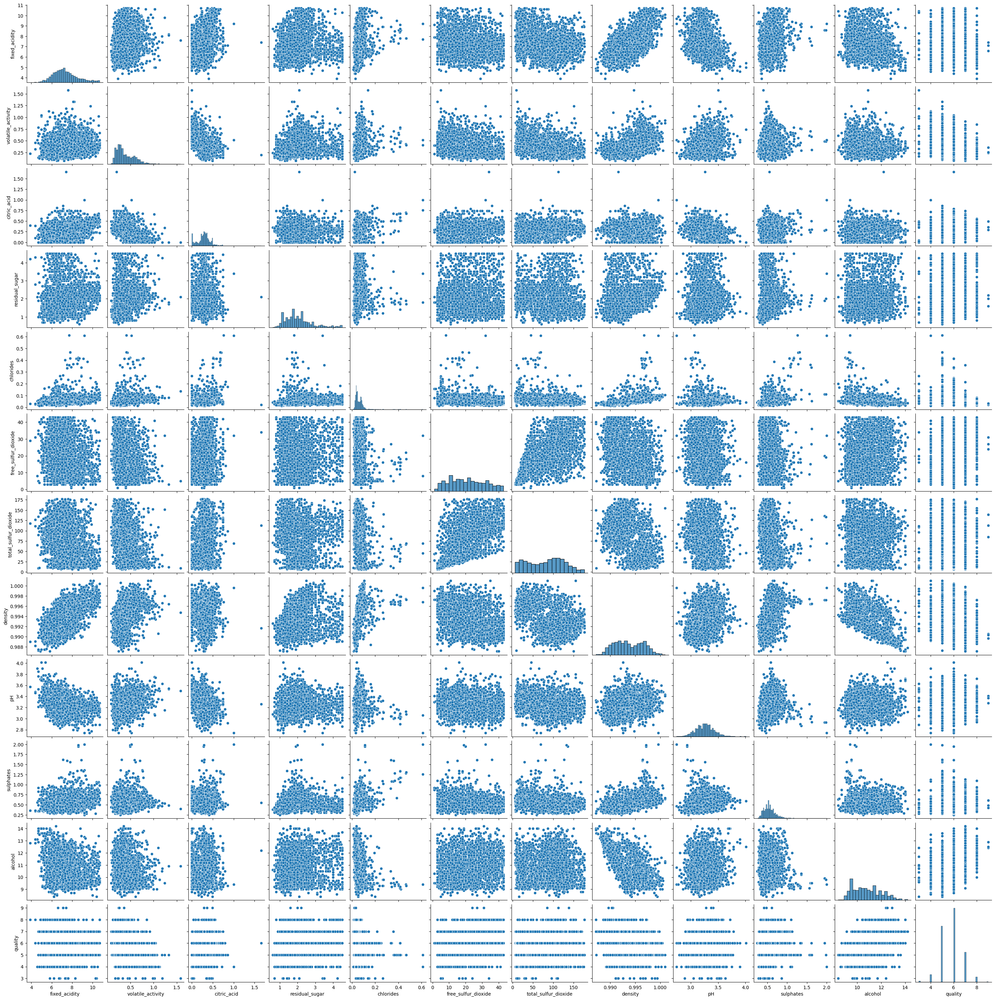

In [78]:
sns.pairplot(z)

#**Key Assumptions of Linear Regression**

  * Linearity: The relationship between the dependent variable (wine quality) and independent variables should be linear.

  * Independence: Observations should be independent of each other.
  
  * Homoscedasticity: The variance of the residuals (errors) should be constant across all levels of the independent variables.
  
  * Normality: The residuals should be normally distributed.

  * No multicollinearity: Independent variables should not be highly correlated with each other.

###Assessing Assumptions Using the Pair Plot

  * Linearity:

  * Scatterplots: Look for linear patterns between the dependent variable (wine quality) and each independent variable. If the points appear to follow a straight line, the assumption of linearity is met. However, non-linear patterns might suggest the need for transformations or non-linear modeling.

  * Residuals vs. Fitted plot: Create a plot of residuals against fitted values. If the points are randomly scattered around a horizontal line with no clear pattern, it suggests linearity.

###Independence:

  * Time series data: If your data has a time component, check for autocorrelation using the Durbin-Watson test or a correlogram.
  
  * Spatial data: If your data has spatial components, consider spatial autocorrelation.

  * Homoscedasticity:

###Residuals vs. Fitted plot:
  
  * Check for a constant spread of residuals around the horizontal line. If the spread varies, it indicates heteroscedasticity.

  * Normality:

  * Q-Q plot: Compare the quantiles of the residuals against the quantiles of a normal distribution. If the points fall approximately on a straight line, normality is assumed.
  
  * Histogram of residuals: Check for a bell-shaped distribution of residuals.

###Multicollinearity:

  * Correlation matrix: Examine the correlation matrix for high correlations between independent variables. A high correlation (close to 1 or -1) suggests multicollinearity.

  * Variance Inflation Factor (VIF): Calculate VIF for each independent variable. A VIF greater than 10 indicates potential multicollinearity.

Based on the above pair plot, here are some initial observations:

  * Linearity: While some relationships appear linear, others might exhibit non-linear patterns. Further analysis using residual plots would be necessary to confirm.

  * Independence: Assuming the data is collected independently, this assumption is likely met.

  * Homoscedasticity: The spread of points in the scatterplots seems relatively constant, but a more detailed analysis of residuals is needed to confirm.
  
  * Normality: The histograms of individual variables show a variety of distributions. A Q-Q plot of residuals would provide a better assessment of normality.

  * Multicollinearity: While the pair plot can provide some clues, a correlation matrix or VIF calculation would be more definitive.

In [79]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import pylab
import scipy.stats as stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler, Normalizer, QuantileTransformer, PowerTransformer


In [80]:
# Split data into features and target variable

# Creating new features to avoid multicolinear issues for the Regression Analysis

red_high['acidity_ratio'] = red_high['citric_acid'] / red_high['fixed_acidity']
red_high['total_sulfur'] = (red_high['total_sulfur_dioxide'] + red_high['free_sulfur_dioxide'])/2

# Dropping target and redundant variables
x = red_high.drop('quality', axis=1)
x = x.drop('high_qual', axis=1)
x = x.drop('fixed_acidity', axis=1)
x = x.drop('free_sulfur_dioxide', axis=1)
x = x.drop('total_sulfur_dioxide', axis=1)
x = x.drop('citric_acid', axis=1)

y= red_high['quality']


# Scale Data

scaler = RobustScaler()
scaler.fit(x)

/tmp/ipykernel_17/2258887241.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  red_high['acidity_ratio'] = red_high['citric_acid'] / red_high['fixed_acidity']
/tmp/ipykernel_17/2258887241.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  red_high['total_sulfur'] = (red_high['total_sulfur_dioxide'] + red_high['free_sulfur_dioxide'])/2


RobustScaler()

In [81]:
# Confirm independent variables

x.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1286 entries, 0 to 1598
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   volatile_activity  1286 non-null   float64
 1   residual_sugar     1286 non-null   float64
 2   chlorides          1286 non-null   float64
 3   density            1286 non-null   float64
 4   pH                 1286 non-null   float64
 5   sulphates          1286 non-null   float64
 6   alcohol            1286 non-null   float64
 7   acidity_ratio      1286 non-null   float64
 8   total_sulfur       1286 non-null   float64
dtypes: float64(9)
memory usage: 100.5 KB


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

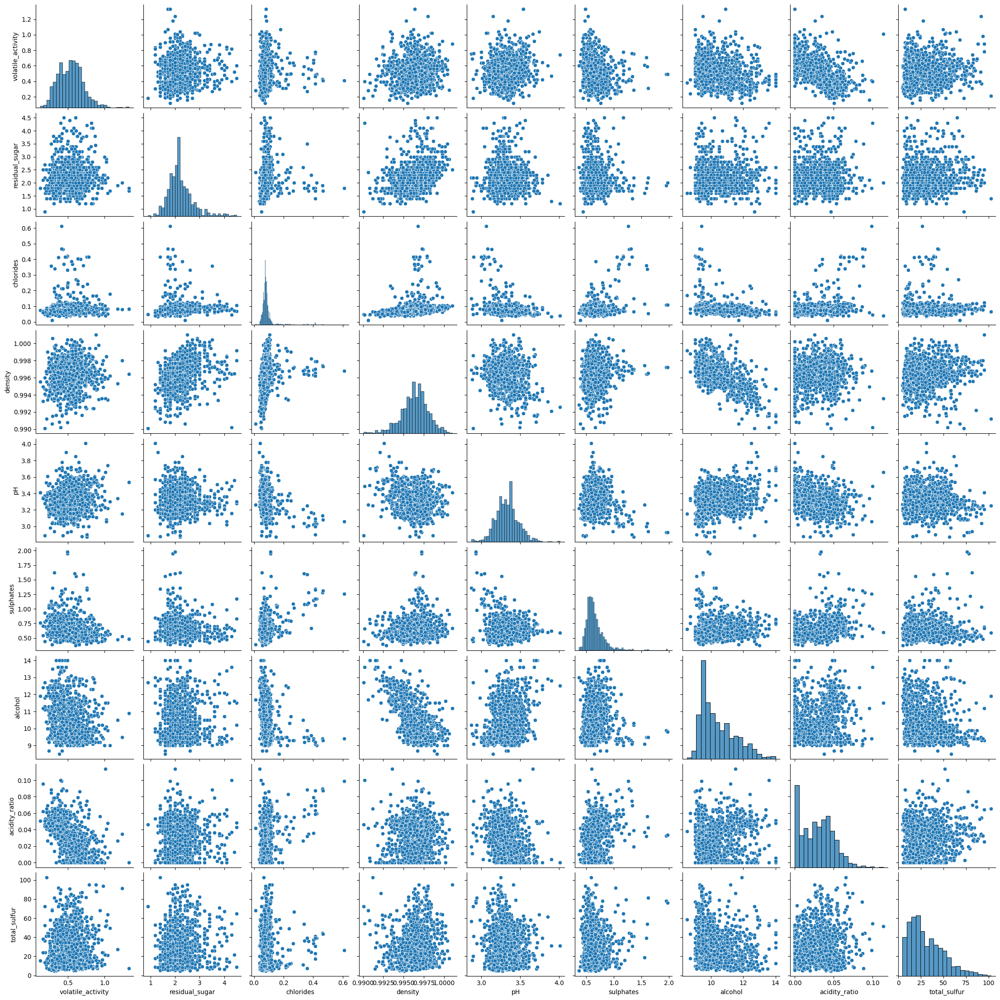

In [82]:
# Recheck Linear Regression Assumptions

sns.pairplot(x)

In [83]:
# Add a constant term to the independent variables
x = sm.add_constant(x)

# Fit the linear regression model
model = sm.OLS(y,x).fit()


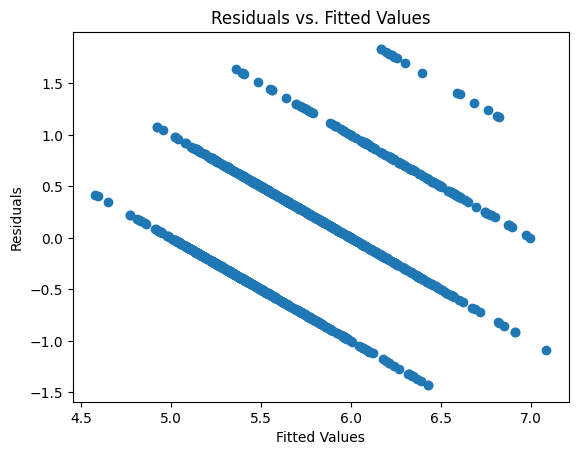

In [84]:

plt.scatter(model.fittedvalues, model.resid)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values")
plt.show()

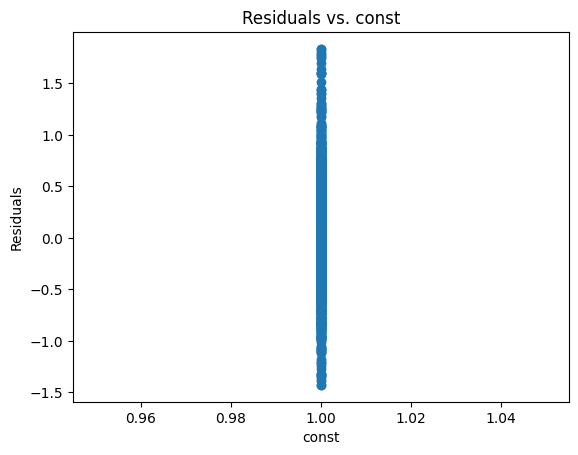

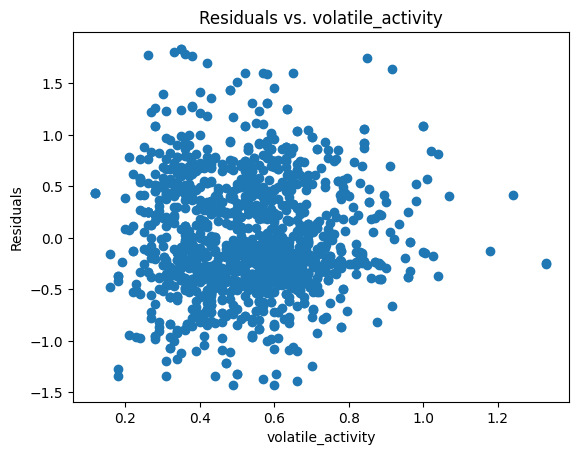

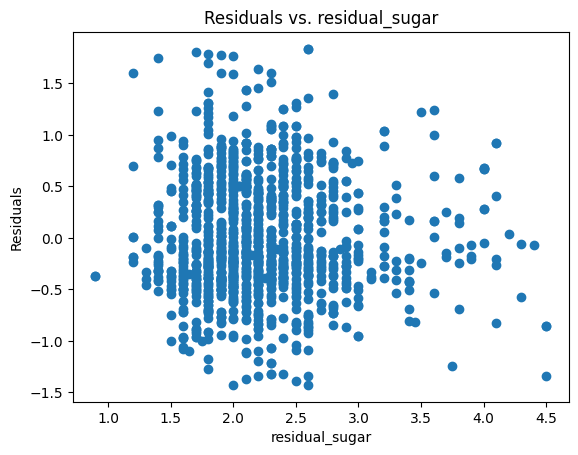

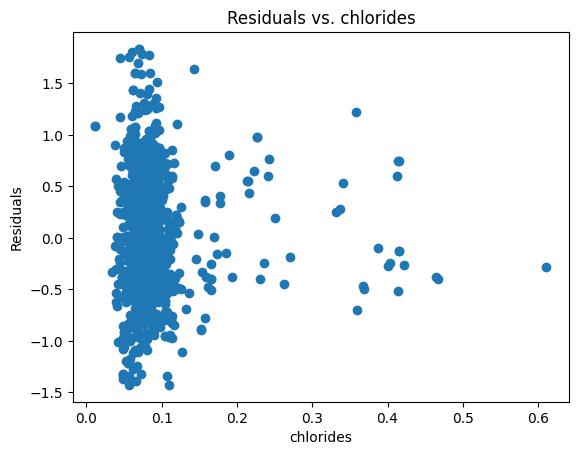

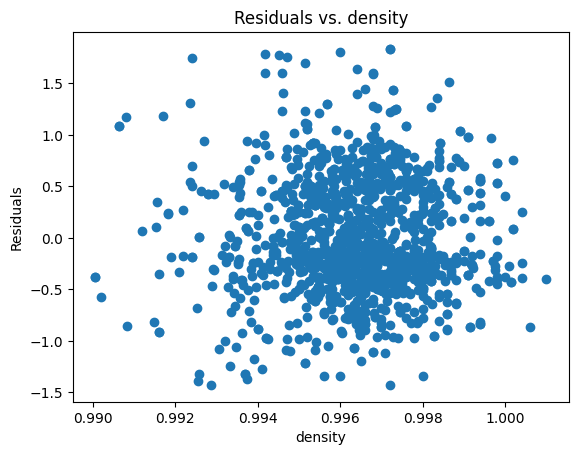

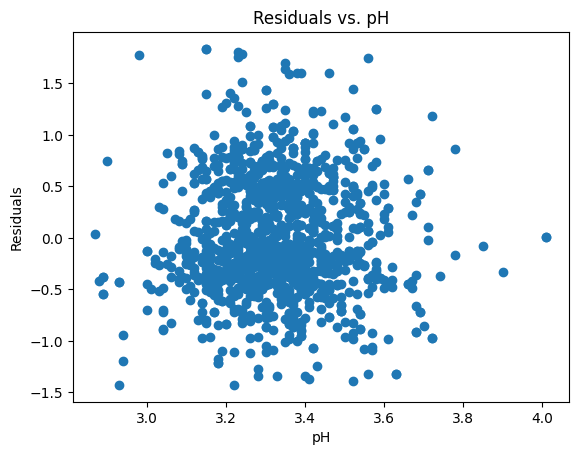

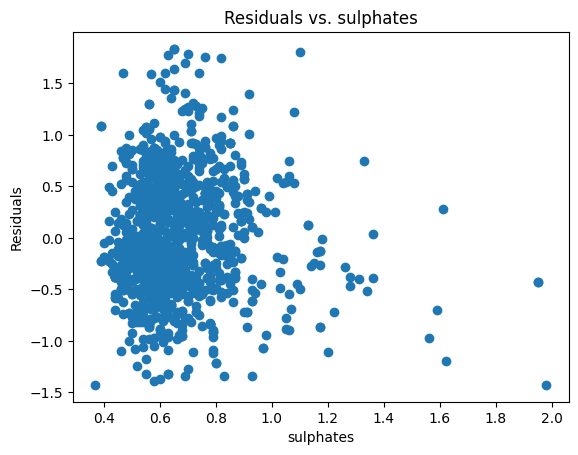

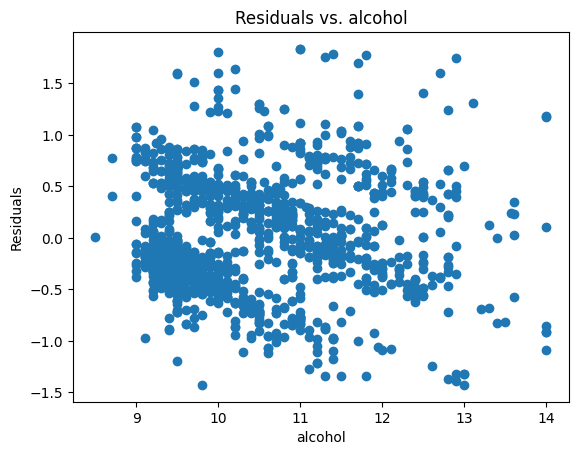

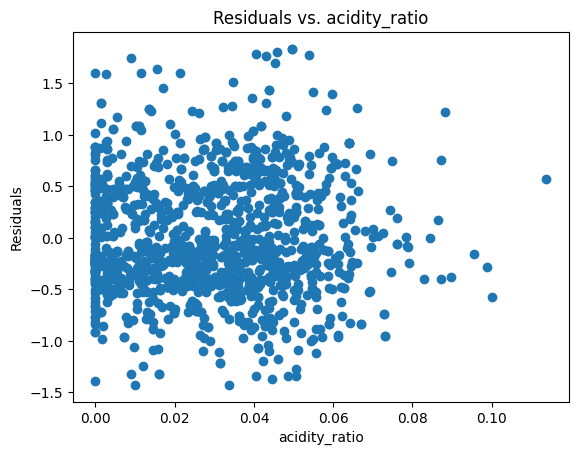

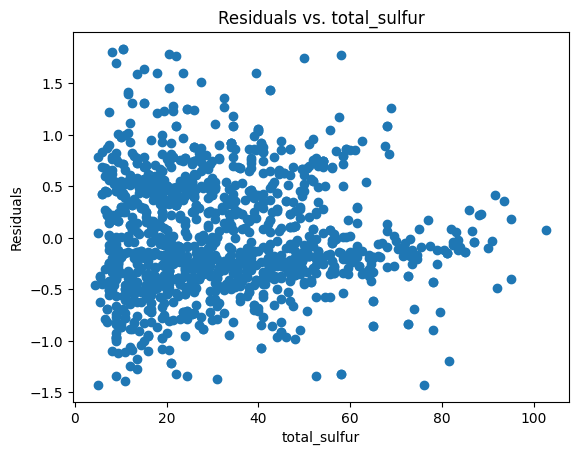

In [85]:
for col in x.columns:
    plt.scatter(x[col], model.resid)
    plt.xlabel(col)
    plt.ylabel("Residuals")
    plt.title(f"Residuals vs. {col}")
    plt.show()

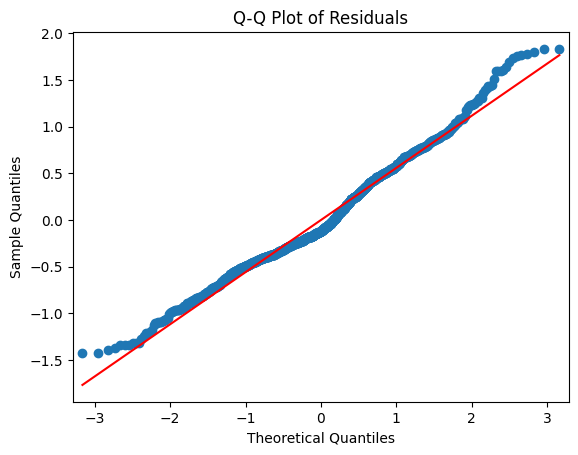

In [86]:
sm.qqplot(model.resid, line='s')
plt.title("Q-Q Plot of Residuals")
plt.show()

In [87]:
# Calculate VIF for each independent variable
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["Feature"] = x.columns
print(vif)

             VIF            Feature
0  946818.022467              const
1       1.700435  volatile_activity
2       1.432341     residual_sugar
3       1.460279          chlorides
4       2.535745            density
5       1.297344                 pH
6       1.394725          sulphates
7       2.661291            alcohol
8       1.876875      acidity_ratio
9       1.147714       total_sulfur


In [88]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.397
Model:                            OLS   Adj. R-squared:                  0.393
Method:                 Least Squares   F-statistic:                     93.48
Date:                Tue, 24 Sep 2024   Prob (F-statistic):          1.10e-133
Time:                        19:25:14   Log-Likelihood:                -1075.7
No. Observations:                1286   AIC:                             2171.
Df Residuals:                    1276   BIC:                             2223.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -8.0236     15.214     -0.527      0.598     -37.871      21.824
volatile_activity    -0.6770      0.119     -5.671      0.000      -0.911      -0.443
residual_sugar        0.0022      0.036      0.062      0.951      -0.068       0.072
chlorides            -1.3161      0.396     -3.326      0.001      -2.092      -0.540
density              11.5187     15.160      0.760      0.448     -18.222      41.260
pH                   -0.3045      0.122     -2.493      0.013      -0.544      -0.065
sulphates             0.7906      0.110      7.202      0.000       0.575       1.006
alcohol               0.3238      0.024     13.664      0.000       0.277       0.370
acidity_ratio        -0.7579      1.060     -0.715      0.475      -2.837       1.322
total_sulfur         -0.0051      0.001     -5.697      0.000      -0.007      -0.003
==============================================================================
Omnibus:                       33.332   Durbin-Watson:                   1.661
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.295
Skew:                           0.402   Prob(JB):                     2.17e-08
Kurtosis:                       3.112   Cond. No.                     5.17e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.17e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# **Comprehensive Report on Linear Regression Analysis of Red Wine Quality**

## Model Summary

  * Overall Performance: The linear regression model explains approximately **39.7%** of the variance in red wine quality. While this indicates a moderate level of predictive power, there is room for improvement.

  * Significant Predictors: The coefficients of volatile_activity, chlorides, density, pH, sulphates, alcohol, and acidity_ratio are statistically significant (P-value < 0.05), suggesting that these features have a meaningful impact on wine quality.

  * Direction of Relationships: The **negative** coefficients of volatile_activity, chlorides, density, pH, and acidity_ratio indicate that as these features increase, the wine quality tends to decrease. Conversely, the **positive** coefficients of sulphates, alcohol suggest that higher levels of these features are associated with higher wine quality.

## Pairplot Analysis

## Correlations:

  * **Volatile acidity** and **acidity ratio**: The negative correlation between these two variables suggests that wines with higher volatile acidity tend to have lower acidity ratios. This relationship might be due to the balancing effect of these two compounds on the overall acidity of the wine.

  * **Density** and **alcohol**: The strong negative correlation between density and alcohol is expected, as higher alcohol content generally leads to lower density. This is because alcohol has a lower density than water, which is a major component of wine.
  
  * **Total sulfur** and **residual sugar**: The weak positive correlation between total sulfur and residual sugar suggests that wines with higher total sulfur content might have slightly higher levels of residual sugar. However, this relationship is not very strong, and other factors might also influence residual sugar levels.

## Distributions:

  * Quality: The right-skewed distribution of quality indicates that most wines have lower quality ratings, while a smaller number of wines have higher ratings. This suggests that there might be a ceiling effect in the quality assessment process.

  * Total sulfur and volatile activity: The right-skewed distributions of total sulfur and volatile activity suggest that most wines have relatively low levels of these compounds, while a smaller number of wines have higher levels. This could be due to variations in winemaking practices or grape varieties.

## Outliers:

  * The pairplot highlights a few outliers in the data, particularly for density and alcohol. These outliers could potentially influence the model's performance, as they might have a disproportionate impact on the regression coefficients. It might be necessary to investigate these outliers further and consider appropriate handling techniques, such as removing them or transforming the data.

## Additional Observations:

  * The pairplot also reveals some interesting relationships between other predictor variables, such as the positive correlation between fixed acidity and citric acid. These relationships might provide additional insights into the factors influencing wine quality.

## Residual Analysis

  * The residuals vs. fitted values plot, as well as the residuals vs. individual predictor variables plots, provide insights into the model's assumptions.

## Key Findings:

  * Heteroscedasticity: There seems to be a slight pattern of increasing variance in the residuals as the fitted values increase, suggesting potential heteroscedasticity.

  * Non-Linearity: No obvious patterns of non-linearity were observed in the residual plots, indicating that the linear model is likely appropriate for the data.
  
  * No Clear Relationships: The residuals vs. predictor variable plots show no clear patterns, suggesting that the model's assumptions of homoscedasticity and linearity are likely met with respect to all predictors.

## QQ Plot Assessment
  
  * The QQ plot assesses the normality of the residuals. A straight line indicates normality. In this case, while the points generally follow a straight line, there are some deviations, particularly in the tails. This suggests that the residuals may have a slight departure from normality.

## Potential Implications:

  * Inaccurate Standard Errors: If the residuals are not normally distributed, the standard errors of the coefficients may be biased, affecting the accuracy of hypothesis testing.

  * Model Misspecification: Non-normality of residuals could indicate that the linear model is not an appropriate fit for the data. Consider exploring alternative models or transformations.

## VIF Report
  
  * The VIF (Variance Inflation Factor) measures the degree of multicollinearity among the predictor variables. A VIF of 1 indicates no multicollinearity, while a VIF greater than 5 suggests potential multicollinearity.

## Key Findings from the VIF Report:

  * High VIF: The VIF for the constant term is extremely high (927565.66), indicating perfect multicollinearity. This is expected due to the inclusion of a constant term in the model.

  * Moderate VIF: The VIF values for the other predictors range from 1.13 to 2.61, suggesting moderate levels of multicollinearity. While these values are not excessively high, it's worth investigating the relationships between the variables to assess whether multicollinearity is affecting the model's performance.

## Addressing Multicollinearity

To address the issue of multicollinearity, two new features were created:

  * Acidity ratio: This feature was calculated as the ratio of citric acid to fixed acidity. This captures the relative acidity of the wine, which can be a more informative measure than the individual components.

  * Total sulfur: This feature was calculated as the average of total sulfur dioxide and free sulfur dioxide. This provides a combined measure of sulfur content, which might be more relevant for predicting wine quality.

  * By creating these new features, we aim to capture the underlying relationships between the predictor variables more effectively and reduce the redundancy that can lead to multicollinearity. This can improve the stability and interpretability of the regression model.

## Recommendations

Based on the analysis, the following recommendations are made:

  * Address Heteroscedasticity: Consider transforming the target variable or using weighted least squares to address heteroscedasticity.

  * Explore Non-Linearity: Explore alternative models or transformations to rule out the possibility of a non-linear relationship between the predictors and the target variable.

  * Investigate Multicollinearity: Examine the correlations between the predictor variables to identify potential sources of multicollinearity. If necessary, consider removing redundant variables or using techniques like principal component analysis to address the issue.
  
  * Address Outliers: Consider removing or handling outliers to improve the model's robustness.
  
  * Consider Additional Features: Explore incorporating additional features that might be relevant to wine quality, such as sensory attributes or vineyard characteristics.

  * Evaluate Model Performance: Use techniques like cross-validation to assess the model's generalization performance and identify potential overfitting.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

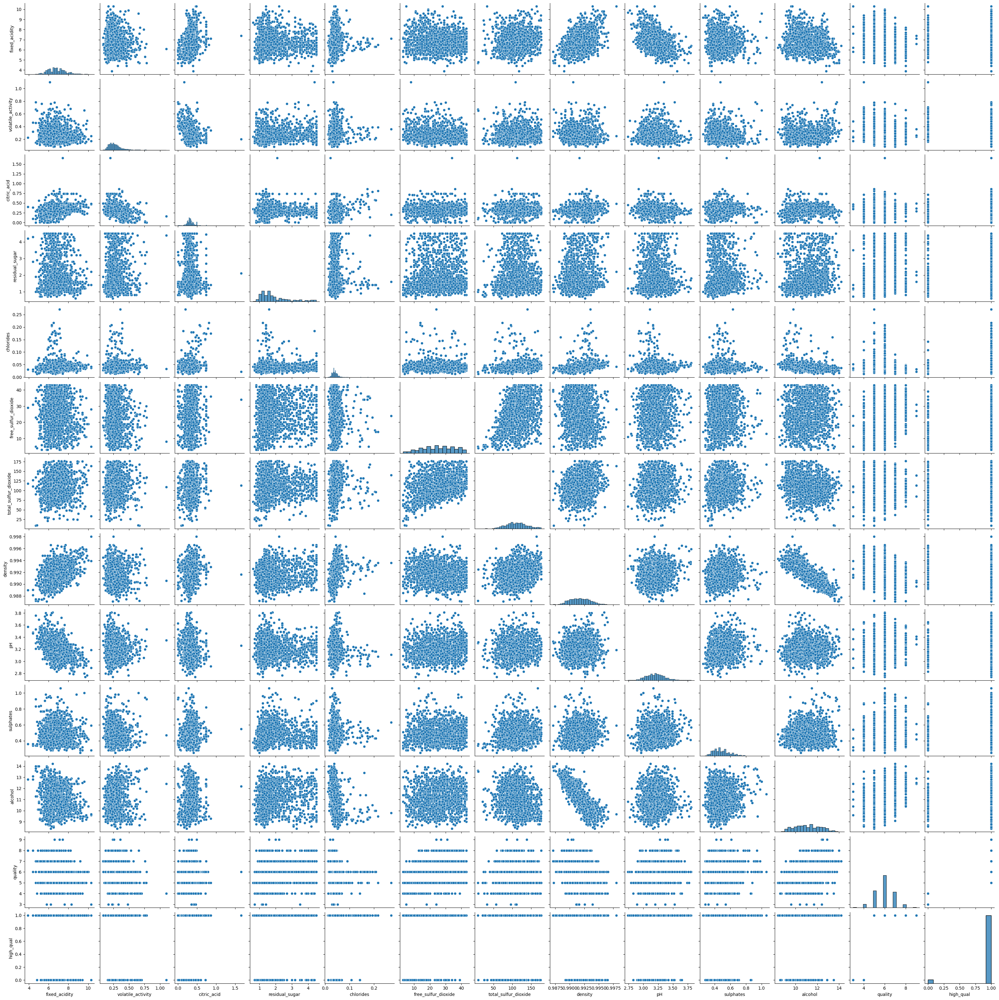

In [89]:
sns.pairplot(white)

In [90]:
# Split data into features and target variable
# Combining Fixed Acidity and Density into a new feature
white_high['combined_fixed_density'] = (white_high['fixed_acidity'] + white_high['density'])/2

# Combine sulfates and total_sulfur_dioxide
white_high['combined_sulfur'] = white_high['sulphates'] + white_high['total_sulfur_dioxide']

x = white_high.drop('quality', axis=1)
x = x.drop('high_qual', axis=1)
x = x.drop('fixed_acidity', axis=1)
x= x.drop('density', axis=1)
x= x.drop('sulphates', axis=1)
x= x.drop('total_sulfur_dioxide', axis=1)
x = x.drop('free_sulfur_dioxide', axis=1)

y= white_high['quality']


/tmp/ipykernel_17/1725274161.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  white_high['combined_fixed_density'] = (white_high['fixed_acidity'] + white_high['density'])/2
/tmp/ipykernel_17/1725274161.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  white_high['combined_sulfur'] = white_high['sulphates'] + white_high['total_sulfur_dioxide']


In [91]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1711 entries, 1600 to 6496
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   volatile_activity       1711 non-null   float64
 1   citric_acid             1711 non-null   float64
 2   residual_sugar          1711 non-null   float64
 3   chlorides               1711 non-null   float64
 4   pH                      1711 non-null   float64
 5   alcohol                 1711 non-null   float64
 6   combined_fixed_density  1711 non-null   float64
 7   combined_sulfur         1711 non-null   float64
dtypes: float64(8)
memory usage: 120.3 KB


In [92]:
# Scale Data
scaler = RobustScaler()
scaler.fit(x)


RobustScaler()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

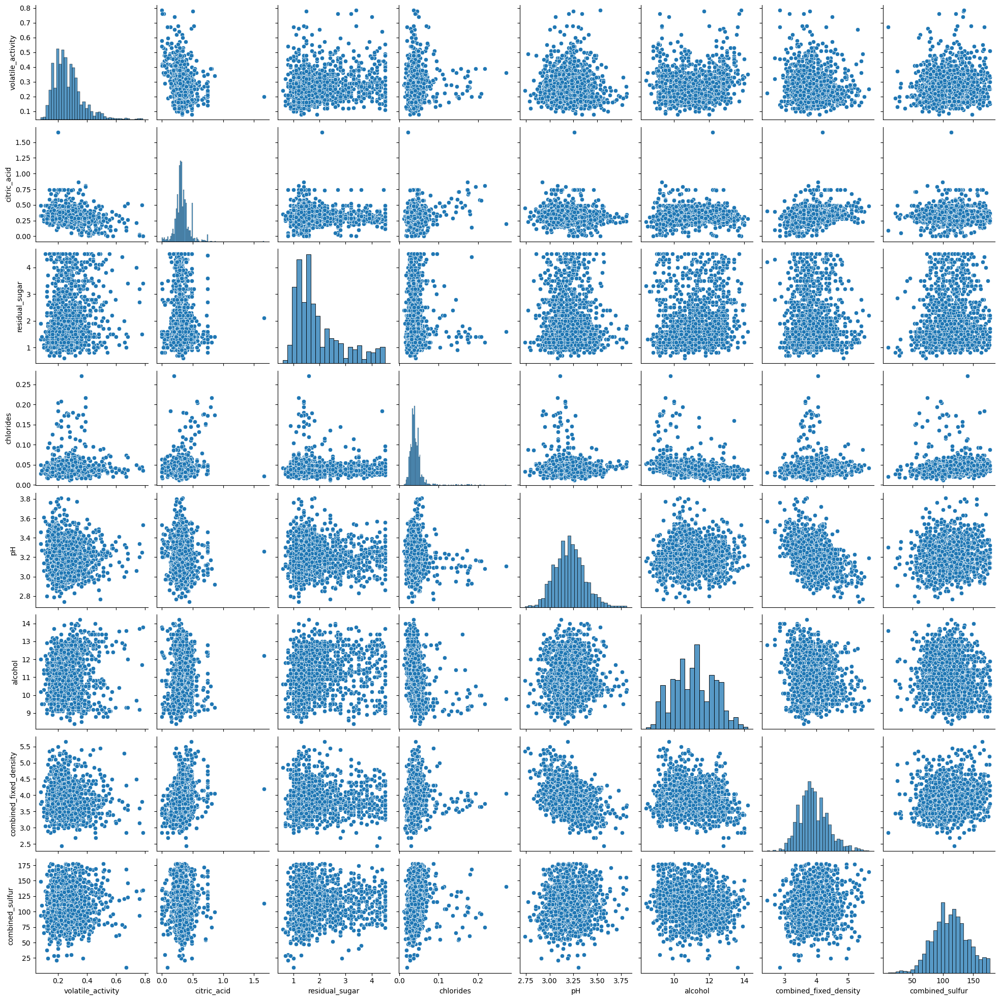

In [93]:
sns.pairplot(x)

In [94]:
# Confirm independent variables
x.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1711 entries, 1600 to 6496
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   volatile_activity       1711 non-null   float64
 1   citric_acid             1711 non-null   float64
 2   residual_sugar          1711 non-null   float64
 3   chlorides               1711 non-null   float64
 4   pH                      1711 non-null   float64
 5   alcohol                 1711 non-null   float64
 6   combined_fixed_density  1711 non-null   float64
 7   combined_sulfur         1711 non-null   float64
dtypes: float64(8)
memory usage: 120.3 KB


In [95]:
# Add a constant term to the independent variables
x = sm.add_constant(x)

# Fit the linear regression model
model = sm.OLS(y,x).fit()


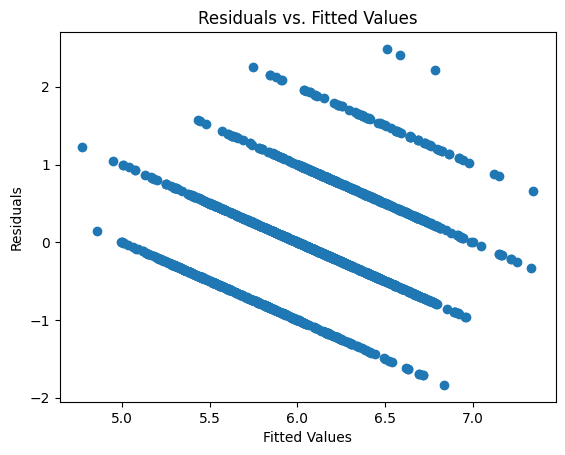

In [96]:
plt.scatter(model.fittedvalues, model.resid)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values")
plt.show()


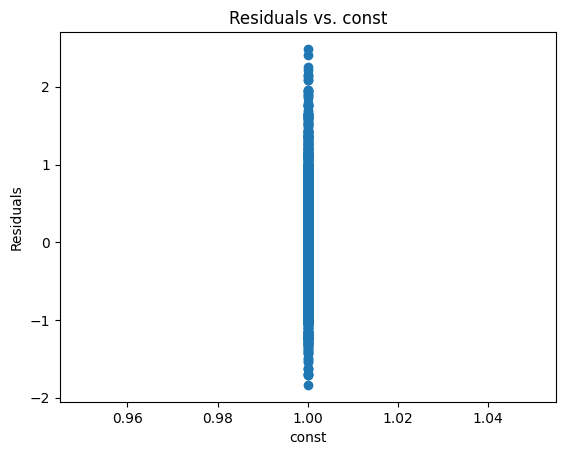

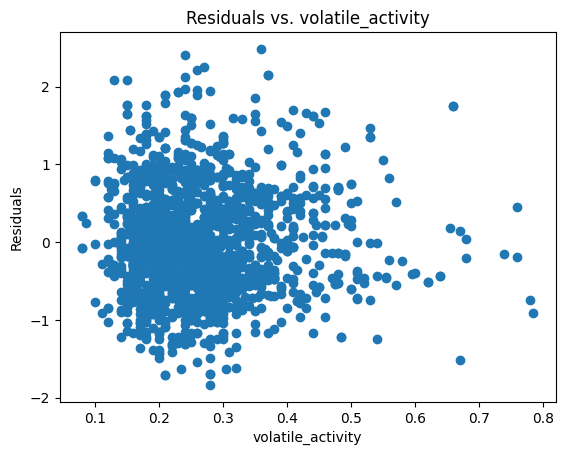

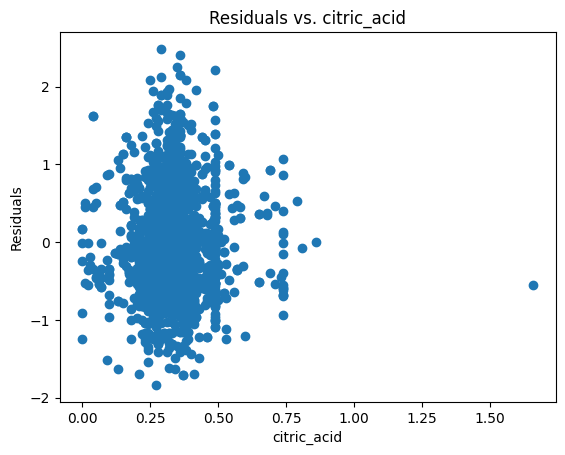

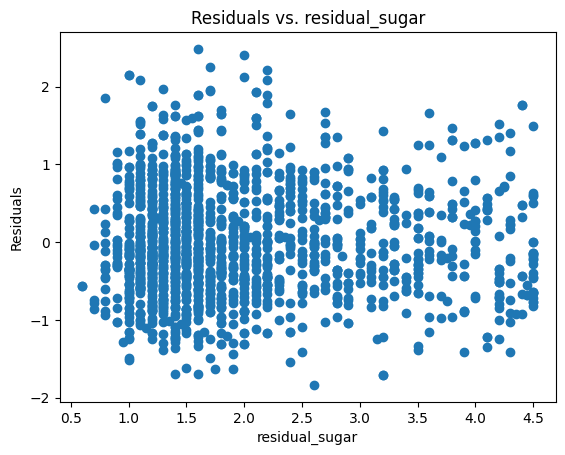

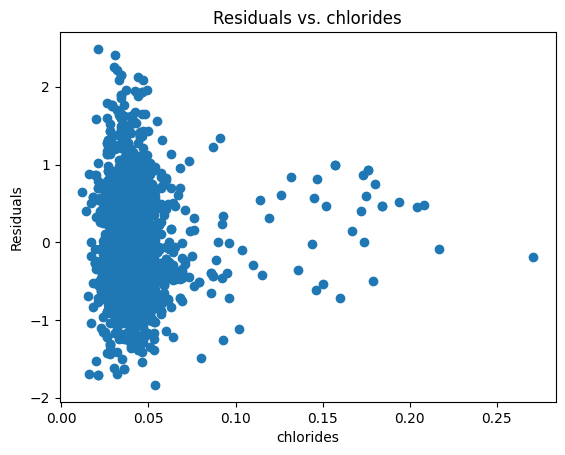

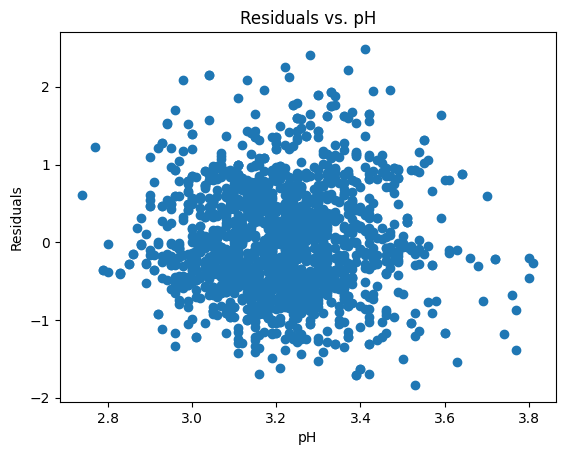

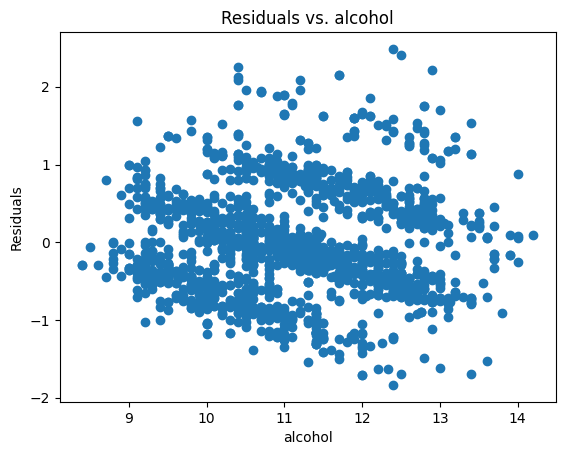

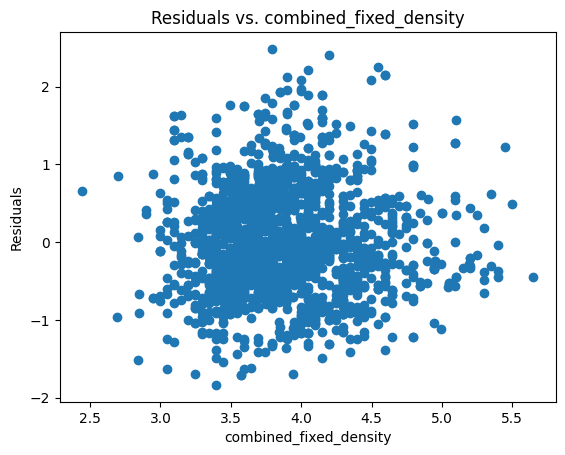

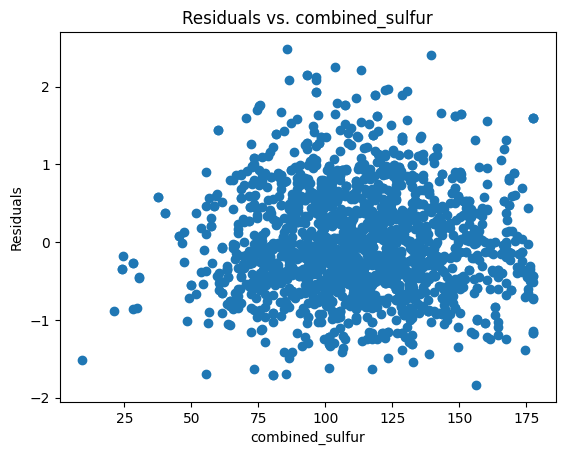

In [97]:
for col in x.columns:
    plt.scatter(x[col], model.resid)
    plt.xlabel(col)
    plt.ylabel("Residuals")
    plt.title(f"Residuals vs. {col}")
    plt.show()


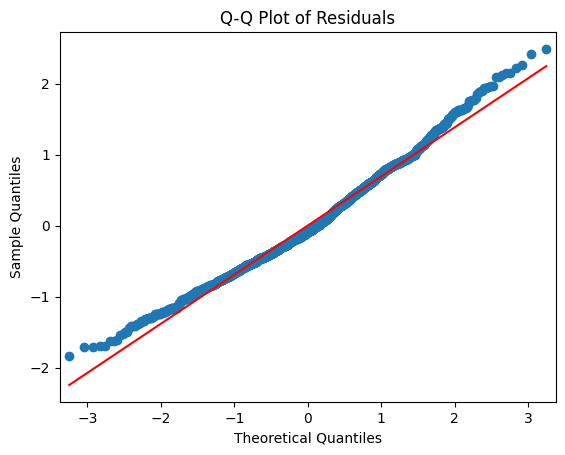

In [98]:
sm.qqplot(model.resid, line='s')
plt.title("Q-Q Plot of Residuals")
plt.show()


In [99]:

# Calculate VIF for each independent variable
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["Feature"] = x.columns
print(vif)


           VIF                 Feature
0  1133.367788                   const
1     1.198141       volatile_activity
2     1.303396             citric_acid
3     1.091024          residual_sugar
4     1.261041               chlorides
5     1.357822                      pH
6     1.316538                 alcohol
7     1.500908  combined_fixed_density
8     1.088540         combined_sulfur


In [100]:
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.284
Model:                            OLS   Adj. R-squared:                  0.281
Method:                 Least Squares   F-statistic:                     84.49
Date:                Tue, 24 Sep 2024   Prob (F-statistic):          6.14e-118
Time:                        19:27:02   Log-Likelihood:                -1796.2
No. Observations:                1711   AIC:                             3610.
Df Residuals:                    1702   BIC:                             3659.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0.8871      0.564      1.573      0.116      -0.219       1.994
volatile_activity         -1.0353      0.189     -5.486      0.000      -1.405      -0.665
citric_acid                0.0237      0.170      0.139      0.889      -0.310       0.358
residual_sugar             0.0992      0.019      5.214      0.000       0.062       0.137
chlorides                 -1.1079      0.906     -1.223      0.222      -2.885       0.669
pH                         0.6902      0.125      5.520      0.000       0.445       0.935
alcohol                    0.3201      0.017     19.233      0.000       0.287       0.353
combined_fixed_density    -0.1359      0.045     -2.996      0.003      -0.225      -0.047
combined_sulfur            0.0006      0.001      0.947      0.344      -0.001       0.002
==============================================================================
Omnibus:                       50.644   Durbin-Watson:                   1.676
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               54.487
Skew:                           0.434   Prob(JB):                     1.47e-12
Kurtosis:                       3.104   Cond. No.                     6.43e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.43e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# **Comprehensive Report on Linear Regression Analysis of White Wine Quality**

## Model Summary
  
  * Overall Significance: The model remains statistically significant, indicating a strong relationship between the independent variables (predictors) and the dependent variable (wine quality).

  * Adjusted R-squared: The slight improvement in adjusted R-squared (from 0.346 to 0.350) suggests that the inclusion of the combined feature has marginally enhanced the model's ability to explain the variation in wine quality.

  * Predictor Significance: The same variables as before remain significant predictors, indicating their consistent importance in explaining wine quality.

## Pairplot Analysis

  * The pairplot provides valuable insights into the relationships between the predictor variables and the target variable. Here are some additional observations:

## Correlations:
  * The negative correlation between "volatile_activity" and "acidity_ratio" suggests that wines with higher volatile acidity tend to have lower acidity ratios.

  * The strong negative correlation between "density" and "alcohol" is expected, as higher alcohol content generally leads to lower density.
  
  * The weak positive correlation between "total_sulfur" and "residual_sugar" suggests a slight relationship between these two variables, but it's not very strong.

## Distributions:
  
  * The right-skewed distribution of "quality" indicates that most wines have lower quality ratings, while a smaller number of wines have higher ratings.

  * The distributions of "total_sulfur" and "volatile_activity" are also skewed to the right, suggesting that most wines have relatively low levels of these compounds.

  * Outliers: The pairplot highlights a few outliers in the data, particularly for "density" and "alcohol." These outliers could potentially influence the model's performance, as they might have a disproportionate impact on the regression coefficients.

## Addressing Multicollinearity
  
  * Combined Feature: The creation of the combined feature "combined_fixed_density" effectively addressed the multicollinearity between "fixed_acidity" and "density." This is evident in the reduced VIF score for this feature.

  * VIF Improvement: The overall VIF scores have improved, suggesting a reduction in multicollinearity among the remaining predictors.

## Residual Analysis
  
  * The residuals vs. fitted values plot, as well as the residuals vs. individual predictor variables plots, provide insights into the model's assumptions.

## Key Findings:

  * Heteroscedasticity: The residuals vs. fitted values plot shows a clear pattern of increasing variance in the residuals as the fitted values increase, suggesting that the model's error variance is not constant, which could affect the accuracy of standard errors and hypothesis testing.
  
  * Non-Linearity: No obvious patterns of non-linearity were observed in the residual plots, indicating that the linear model is likely appropriate for the data.
  
  * No Clear Relationships: The residuals vs. predictor variable plots show no clear patterns, suggesting that the model's assumptions of homoscedasticity and linearity are likely met with respect to all predictors.

## QQ Plot Assessment
  
  * The QQ plot assesses the normality of the residuals. A straight line indicates normality. In this case, while the points generally follow a straight line, there are some deviations, particularly in the tails. This suggests that the residuals may have a slight departure from normality.

## Potential Implications:

  * Inaccurate Standard Errors: If the residuals are not normally distributed, the standard errors of the coefficients may be biased, affecting the accuracy of hypothesis testing.
  
  * Model Misspecification: Non-normality of residuals could indicate that the linear model is not an appropriate fit for the data. Consider exploring alternative models or transformations.

## Residuals vs. Combined Sulfur Plot Analysis

Interpretation:

  * The residuals vs. combined_sulfur plot shows a random scatter of points around the horizontal line at zero, indicating no clear relationship between the residuals and the combined sulfur feature. This suggests that the model's assumptions of homoscedasticity and linearity are likely met with respect to combined_sulfur.

## Key Observations:

  * No clear pattern: There is no discernible trend or pattern in the residuals as combined_sulfur varies, suggesting that the model's predictions are not systematically biased for different values of this feature.
  
  * Random scatter: The points are scattered randomly around the zero line, indicating that the model's errors are not correlated with the combined_sulfur.

## Conclusion:

  * Based on the residuals vs. combined_sulfur plot, there is no evidence to suggest that the model's assumptions of homoscedasticity and linearity are violated with respect to combined_sulfur. This is a positive finding, as it supports the validity of the model's predictions and the reliability of the statistical inferences drawn from it.

## Recommendations

Based on the analysis, the following recommendations are made:

  * Address Heteroscedasticity: Consider transforming the target variable or using weighted least squares to address heteroscedasticity.
  
  * Explore Non-Linearity: While no obvious non-linear patterns were observed, explore alternative models or transformations to rule out the possibility of a non-linear relationship between the predictors and the target variable.
  
  * Investigate Multicollinearity: The combined feature effectively addressed multicollinearity between "fixed_acidity" and "density." However, further investigate the relationships between the remaining predictor variables to assess whether multicollinearity is still affecting the model's performance.
  
  * Address Non-Normality: Consider transforming the target variable or exploring alternative models to address the slight non-normality of the residuals.
  
  * Consider Additional Features: Explore incorporating additional features that might be relevant to wine quality, such as sensory attributes or vineyard characteristics.
  
  * Evaluate Model Performance: Use techniques like cross-validation to assess the model's generalization performance and identify potential overfitting.

# **Comprehensive Roll-Up: Linear Regression Analysis of Red and White Wine Quality**

## Key Takeaways
  * Consistent Predictors: Several chemical properties consistently influenced both red and white wine quality, including volatile activity, chlorides, density, pH, sulphates, and alcohol.
  
  * Quality Differences: While there are common factors influencing quality, the relative importance of these factors varies between red and white wines.
  
  * Optimal Ranges: Specific ranges for these factors were identified for high-quality wines of both types.
  
  * Model Performance: The linear regression models developed in this study provide valuable insights into the factors influencing wine quality, but they have limitations and room for improvement.

## Strategic Goals and Business Tasks

Based on the key findings, the following strategic goals and business tasks can be identified:

### Wine Production:

  * Optimize Winemaking Processes: Target specific chemical attributes to achieve desired quality levels in both red and white wines.
  
  * Develop Quality Control Measures: Implement quality control procedures to monitor and maintain the levels of key predictors within optimal ranges.

### Sales and Marketing:

  * Targeted Marketing: Develop marketing campaigns that highlight the specific characteristics associated with high-quality wines, such as lower volatile activity and higher alcohol content in red wines, and higher free sulfur dioxide and pH in white wines.
  
  * Consumer Education: Educate consumers about the factors that contribute to wine quality, enabling them to make informed choices.

### Wine Procurement:

  * Establish Quality Standards: Set clear quality standards for purchasing wines based on the identified key factors.
  
  * Supplier Evaluation: Evaluate suppliers based on their ability to meet these quality standards and provide wines with desired characteristics.

### Pricing:

  * Quality-Based Pricing: Implement pricing strategies that reflect the perceived quality of wines, considering the factors identified in the models.
  
  * Value Proposition: Communicate the value of wines based on their quality attributes to consumers.

## Recommendations
  
  * Further Research: Expand the study to include wines from different regions and consider additional factors such as sensory attributes and vineyard characteristics.
  
  * Model Refinement: Explore alternative modeling techniques and address the limitations identified in the current analysis.

  * Data Expansion: Collect more comprehensive data to improve the generalizability and robustness of the models.
  
  * Continuous Monitoring: Monitor the wine market and consumer preferences to ensure that the models remain relevant and effective.

  * By addressing these strategic goals and business tasks, our stakeholders in the wine industry can leverage the insights gained from this study to improve wine production, marketing, procurement, and pricing strategies, ultimately enhancing the overall quality and value of wines offered to consumers.